<div align="center">

Universidad de los Andes  
Facultad de Ingeniería  
Departamento de Ingeniería de Sistemas y Computación  

<br><br><br><br>

<p style="font-size:22px; font-weight:bold;">
PROYECTO DE GRADO
</p>

<br><br><br><br>

<p style="font-size:18px; line-height:1.4;">
<strong>
MÉTODOS DE <i>CLUSTERING</i> BASADOS EN <i>DEEP LEARNING</i> APLICADOS EN EL ANÁLISIS<br>
BIOLÓGICO DE LA MICROBIOTA INTESTINAL<br>
</strong>
</p>

<br><br><br><br>

Autor: Juan Felipe Lancheros Carrillo  
Código de estudiante: 202211004

<br><br><br><br>

Asesora: María del Pilar Villamil Giraldo

<br><br><br><br>

Bogotá, Colombia  
2025

</div>

---

## Referencias
* Deng, S. (2020). Clustering with Fuzzy C-means and Common Challenges. Journal of Physics Conference Series, 1453(1), 012137. https://doi.org/10.1088/1742-6596/1453/1/012137
* GeeksforGeeks. (2025c). Clustering in machine learning. GeeksforGeeks. https://www.geeksforgeeks.org/machine-learning/clustering-in-machine-learning/
* GeeksforGeeks. (2025d). Gaussian Mixture Model. GeeksforGeeks. https://www.geeksforgeeks.org/machine-learning/gaussian-mixture-model/
* GeeksforGeeks. (2024). ML | OPTICS Clustering Implementing using Sklearn. GeeksforGeeks. https://www.geeksforgeeks.org/machine-learning/ml-optics-clustering-implementing-using-sklearn/
* GeeksforGeeks. (2025e). OPTICS Clustering ML. GeeksforGeeks. https://www.geeksforgeeks.org/machine-learning/ml-optics-clustering/
* GeeksforGeeks. (2025b). Sparse autoencoders in deep learning. GeeksforGeeks. https://www.geeksforgeeks.org/deep-learning/sparse-autoencoders-in-deep-learning/
* GeeksforGeeks. (2025a). What is a Neural Network? GeeksforGeeks. https://www.geeksforgeeks.org/machine-learning/neural-networks-a-beginners-guide/
* Nanda, A. (2024). Mapas autoorganizativos: Una guía intuitiva con ejemplos en Python. https://www.datacamp.com/es/tutorial/self-organizing-maps
* Priya, B. (2025). MinMax vs Standard vs Robust Scaler: Which One Wins for Skewed Data? MachineLearningMastery.com. https://machinelearningmastery.com/minmax-vs-standard-vs-robust-scaler-which-one-wins-for-skewed-data/
* SciPy. (s.f.). linkage. https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html
* Shah, V. (2022). Customer segmentation: AutoEncoder | Clustering. https://www.kaggle.com/code/vinitshah0110/customer-segmentation-autoencoder-clustering
* Vettigli, G. [@JustGlowing]. (2025). minisom. GitHub. https://github.com/JustGlowing/minisom/
---

## Verificación de las versiones de las librerías

In [ ]:
import os # Introduces randomness in the code
import sys # For checking Python's version
import random # It is part of Python. Introduces randomness in the code
import pandas as pd
import numpy as np # Introduces randomness in the code
import sklearn
import scipy
import matplotlib
import seaborn as sns

print(f"Python version: {sys.version}")
print(f"Pandas version: {pd.__version__}")
print(f"Numpy version: {np.__version__}")
print(f"Scikit-learn version: {sklearn.__version__}")
print(f"Scipy version: {scipy.__version__}")
print(f"Matplotlib version: {matplotlib.__version__}")
print(f"Seaborn version: {sns.__version__}")

Python version: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
Pandas version: 2.2.2
Numpy version: 2.0.2
Scikit-learn version: 1.6.1
Scipy version: 1.16.3
Matplotlib version: 3.10.0
Seaborn version: 0.13.2


In [ ]:
# For SOM
!pip install MiniSom # It says the version inside the parentheses shown in the output (Requires management of randomness)
from minisom import MiniSom
from sklearn.metrics import mutual_info_score
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import squareform
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.cluster.hierarchy import fcluster
from matplotlib.colors import ListedColormap

  Preparing metadata (setup.py) ... done
  Created wheel for MiniSom: filename=MiniSom-2.3.5-py3-none-any.whl size=12031 sha256=d1106359c1062e354720a14107534437fe50764b122a2d7edfd11c043e835bc5
  Stored in directory: /root/.cache/pip/wheels/0f/8c/a4/5b7aa56fa6ef11d536d45da775bcc5a2a1c163ff0f8f11990b
Successfully built MiniSom


In [ ]:
# For SAE + OPTICS
import tensorflow as tf # Introduces randomness
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from scipy import stats
from sklearn.metrics import silhouette_score
from sklearn.cluster import OPTICS
from sklearn.manifold import TSNE
from matplotlib.patches import Patch

print(f"Tensorflow version: {tf.__version__}")

Tensorflow version: 2.19.0


## Lectura de archivos

In [ ]:
df_pandas_encoded = pd.read_csv("microbio_obj.csv", decimal=',', index_col=0)
df_pandas_encoded

,sex,age,Otu00001,Otu00002,Otu00003,Otu00004,Otu00005,Otu00006,Otu00007,Otu00008,...,Otu00197,Otu00201,Otu00220,Otu00228,Otu00284,Otu00325,city_Bogota,city_Bucaramanga,city_Cali,city_Medellin
MI_001_H,1,36,354,817,50,31,448,547,727,353,...,0,14,3,0,2,7,0,0,0,1
MI_002_H,0,40,168,9,131,3005,68,10187,570,2006,...,2,0,4,0,11,89,0,0,0,1
MI_003_H,1,53,19,174,6211,79,1063,0,6077,1852,...,10,139,5,0,0,0,0,0,0,1
MI_004_H,1,58,264,1816,159,16,110,4,12,206,...,7,6,0,0,0,0,0,0,0,1
MI_005_H,0,44,0,2,0,12,598,39,0,0,...,0,0,40,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MI_454_H,1,60,0,1,325,926,109,4661,3,104,...,4,16,0,6,0,0,0,0,1,0
MI_455_H,1,60,187,1270,646,29983,100,186,4,9,...,16,0,1,14,3,0,0,0,1,0
MI_456_H,0,46,418,1512,198,20,1620,198,575,7,...,0,7,18,67,0,34,0,0,1,0
MI_458_H1,1,40,189,3443,130,7428,375,13,28,82,...,10,0,0,0,3,0,0,0,1,0


In [ ]:
df_otus_tax = pd.read_csv("otus_tax_filtered.csv", index_col=0)
df_otus_tax

,OTU,Taxonomy,Phylum,Class,Family,Total_Abundance
0,Otu00001,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Prevotellaceae,135732
1,Otu00002,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Prevotellaceae,1127999
2,Otu00003,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Ruminococcaceae,445764
3,Otu00004,k__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Proteobacteria,Gammaproteobacteria,Enterobacteriaceae,1163374
4,Otu00005,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Ruminococcaceae,261473
...,...,...,...,...,...,...
95,Otu00201,k__Bacteria;p__Firmicutes;c__Erysipelotrichi;o...,Firmicutes,Erysipelotrichi,Erysipelotrichaceae,13343
96,Otu00220,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Lachnospiraceae,4822
97,Otu00228,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,[Odoribacteraceae],4235
98,Otu00284,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Lachnospiraceae,6371


In [ ]:
# Read this file if you are testing SOM
data = pd.read_csv("microbio_inicial.csv", decimal=',', index_col=0)
data

,city,sex,age,Otu00001,Otu00002,Otu00003,Otu00004,Otu00005,Otu00006,Otu00007,...,Otu00162,Otu00175,Otu00177,Otu00188,Otu00197,Otu00201,Otu00220,Otu00228,Otu00284,Otu00325
MI_001_H,Medellin,Male,36,354,817,50,31,448,547,727,...,4,54,7,0,0,14,3,0,2,7
MI_002_H,Medellin,Female,40,168,9,131,3005,68,10187,570,...,21,10,3,2,2,0,4,0,11,89
MI_003_H,Medellin,Male,53,19,174,6211,79,1063,0,6077,...,0,0,1,0,10,139,5,0,0,0
MI_004_H,Medellin,Male,58,264,1816,159,16,110,4,12,...,0,0,8,2,7,6,0,0,0,0
MI_005_H,Medellin,Female,44,0,2,0,12,598,39,0,...,0,52,7,54,0,0,40,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MI_454_H,Cali,Male,60,0,1,325,926,109,4661,3,...,0,7,233,6,4,16,0,6,0,0
MI_455_H,Cali,Male,60,187,1270,646,29983,100,186,4,...,1,141,29,0,16,0,1,14,3,0
MI_456_H,Cali,Female,46,418,1512,198,20,1620,198,575,...,0,5,57,4,0,7,18,67,0,34
MI_458_H1,Cali,Male,40,189,3443,130,7428,375,13,28,...,4,5,6,19,10,0,0,0,3,0


## *Scaling*

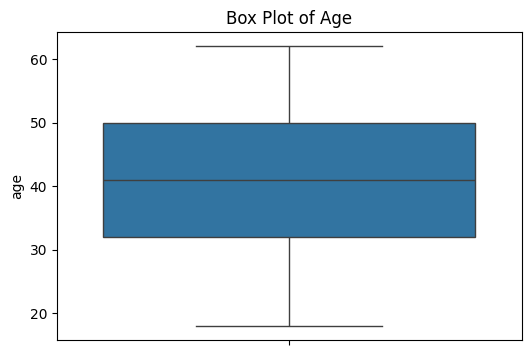

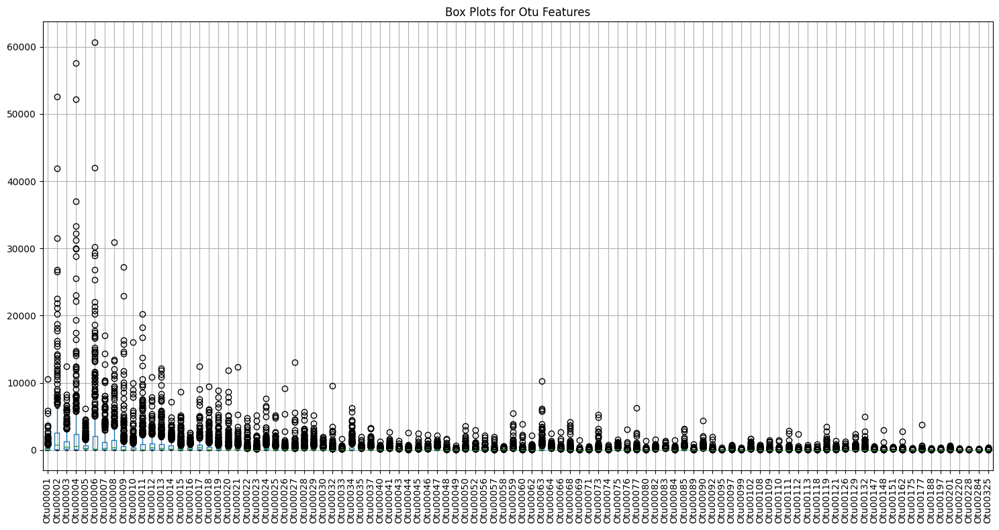

In [ ]:
import matplotlib.pyplot as plt

# Grouping "Otu" features
otu_cols = [col for col in df_pandas_encoded.columns if col.startswith('Otu')]

def boxplot(df):
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df['age'])
    plt.title('Box Plot of Age')
    plt.show()
    plt.figure(figsize=(15, 8))
    df[otu_cols].boxplot()
    plt.title('Box Plots for Otu Features')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

boxplot(df_pandas_encoded)

In [ ]:
outliers_df = pd.DataFrame(data={"OTU": otu_cols}, index=pd.RangeIndex(start=1, stop=len(otu_cols)+1))

def get_outliers(name, df):
    count_column = name + "_" + "count"
    percentage_column = name + "_" + "%"
    for col in otu_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Count outliers
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outliers_df.loc[outliers_df["OTU"] == col, count_column] = len(outliers)
        outliers_df.loc[outliers_df["OTU"] == col, percentage_column] = len(outliers) / df.shape[0]

get_outliers("original", df_pandas_encoded)
outliers_df

,OTU,original_count,original_%
1,Otu00001,40.0,0.090703
2,Otu00002,44.0,0.099773
3,Otu00003,34.0,0.077098
4,Otu00004,53.0,0.120181
5,Otu00005,46.0,0.104308
...,...,...,...
96,Otu00201,51.0,0.115646
97,Otu00220,34.0,0.077098
98,Otu00228,37.0,0.083900
99,Otu00284,37.0,0.083900


In [ ]:
# Identify columns to scale: 'age' and all 'Otu' columns
columns_to_scale = ['age'] + [col for col in df_pandas_encoded.columns if col.startswith('Otu')]

# Identify columns to keep as is: 'sex' and all 'city_' columns
columns_to_keep = [col for col in df_pandas_encoded.columns if col.startswith('sex') or col.startswith('city_')]

# Separate the DataFrame into two parts
df_to_scale = df_pandas_encoded[columns_to_scale]
df_to_keep = df_pandas_encoded[columns_to_keep]

In [ ]:
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler, MaxAbsScaler

# Reference: (Priya, 2025)
robust_scaler = RobustScaler()
min_max_scaler = MinMaxScaler()
standard_scaler = StandardScaler()
max_abs_scaler = MaxAbsScaler()

robust_scaled_part = pd.DataFrame(robust_scaler.fit_transform(df_to_scale),
                           columns=columns_to_scale,
                           index=df_to_scale.index)
min_max_scaled_part = pd.DataFrame(min_max_scaler.fit_transform(df_to_scale),
                           columns=columns_to_scale,
                           index=df_to_scale.index)
standard_scaled_part = pd.DataFrame(standard_scaler.fit_transform(df_to_scale),
                           columns=columns_to_scale,
                           index=df_to_scale.index)
max_abs_scaled_part = pd.DataFrame(max_abs_scaler.fit_transform(df_to_scale),
                           columns=columns_to_scale,
                           index=df_to_scale.index)

In [ ]:
get_outliers("robust", robust_scaled_part)
get_outliers("min_max", min_max_scaled_part)
get_outliers("standard", standard_scaled_part)
get_outliers("max_abs", max_abs_scaled_part)
outliers_df

,OTU,original_count,original_%,robust_count,robust_%,min_max_count,min_max_%,standard_count,standard_%,max_abs_count,max_abs_%
1,Otu00001,40.0,0.090703,40.0,0.090703,40.0,0.090703,40.0,0.090703,40.0,0.090703
2,Otu00002,44.0,0.099773,44.0,0.099773,44.0,0.099773,44.0,0.099773,44.0,0.099773
3,Otu00003,34.0,0.077098,34.0,0.077098,34.0,0.077098,34.0,0.077098,34.0,0.077098
4,Otu00004,53.0,0.120181,53.0,0.120181,53.0,0.120181,53.0,0.120181,53.0,0.120181
5,Otu00005,46.0,0.104308,46.0,0.104308,46.0,0.104308,46.0,0.104308,46.0,0.104308
...,...,...,...,...,...,...,...,...,...,...,...
96,Otu00201,51.0,0.115646,51.0,0.115646,51.0,0.115646,51.0,0.115646,51.0,0.115646
97,Otu00220,34.0,0.077098,34.0,0.077098,36.0,0.081633,36.0,0.081633,34.0,0.077098
98,Otu00228,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900
99,Otu00284,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900


In [ ]:
outliers_df

,OTU,original_count,original_%,robust_count,robust_%,min_max_count,min_max_%,standard_count,standard_%,max_abs_count,max_abs_%
1,Otu00001,40.0,0.090703,40.0,0.090703,40.0,0.090703,40.0,0.090703,40.0,0.090703
2,Otu00002,44.0,0.099773,44.0,0.099773,44.0,0.099773,44.0,0.099773,44.0,0.099773
3,Otu00003,34.0,0.077098,34.0,0.077098,34.0,0.077098,34.0,0.077098,34.0,0.077098
4,Otu00004,53.0,0.120181,53.0,0.120181,53.0,0.120181,53.0,0.120181,53.0,0.120181
5,Otu00005,46.0,0.104308,46.0,0.104308,46.0,0.104308,46.0,0.104308,46.0,0.104308
...,...,...,...,...,...,...,...,...,...,...,...
96,Otu00201,51.0,0.115646,51.0,0.115646,51.0,0.115646,51.0,0.115646,51.0,0.115646
97,Otu00220,34.0,0.077098,34.0,0.077098,36.0,0.081633,36.0,0.081633,34.0,0.077098
98,Otu00228,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900
99,Otu00284,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900,37.0,0.083900


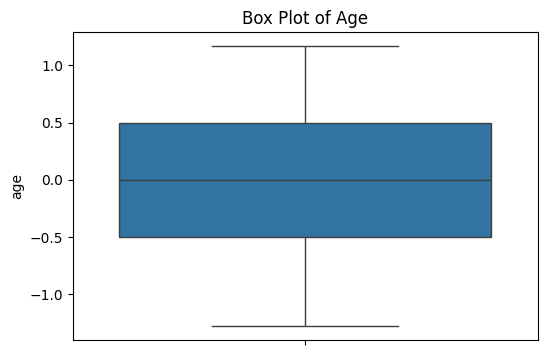

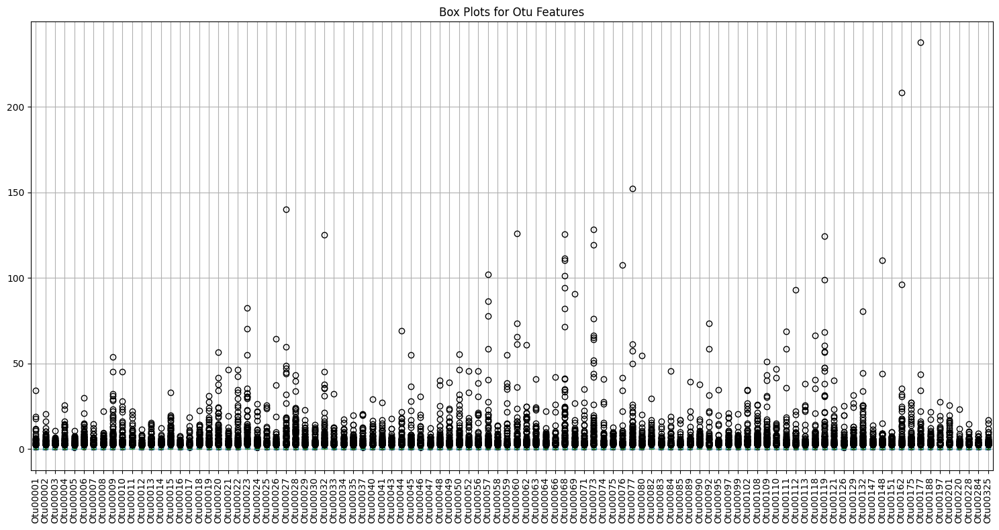

In [ ]:
boxplot(robust_scaled_part)

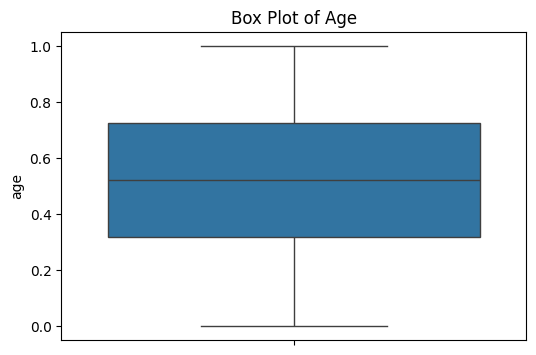

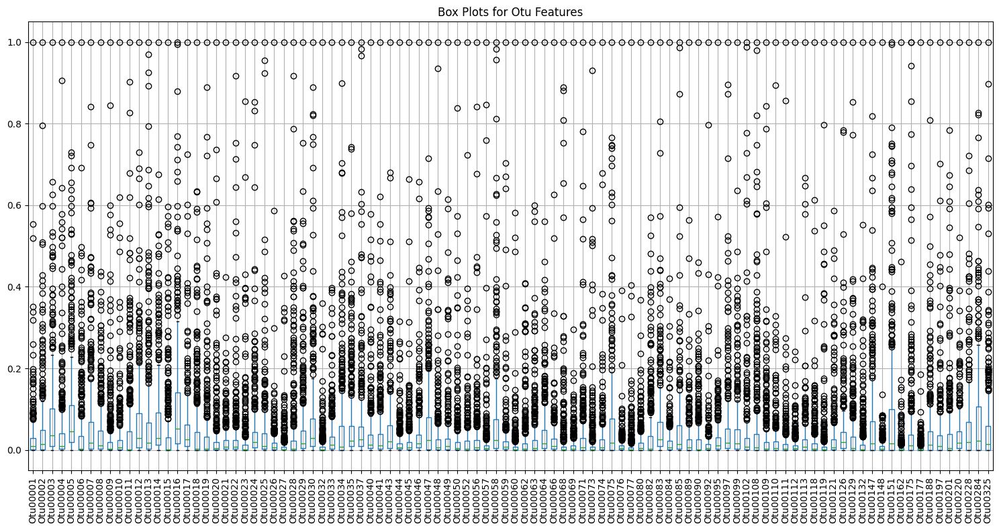

In [ ]:
boxplot(min_max_scaled_part)

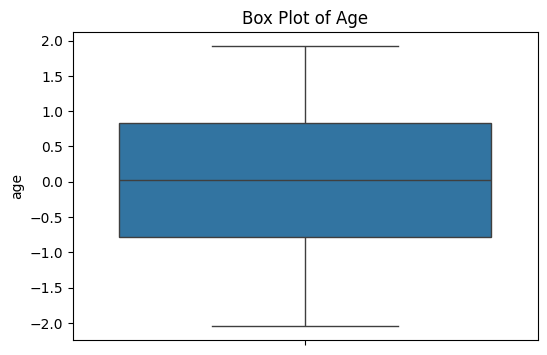

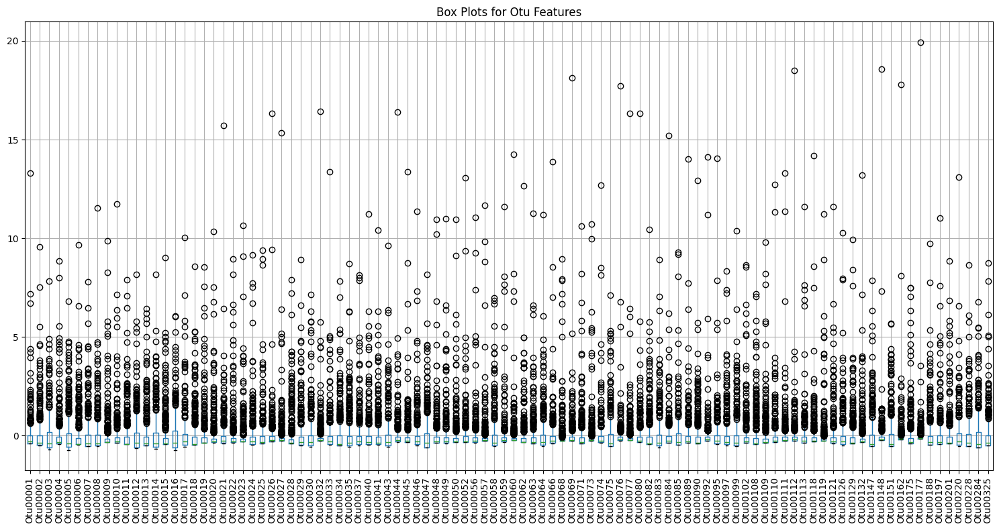

In [ ]:
boxplot(standard_scaled_part)

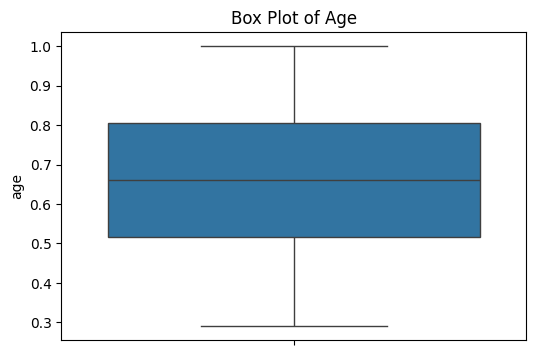

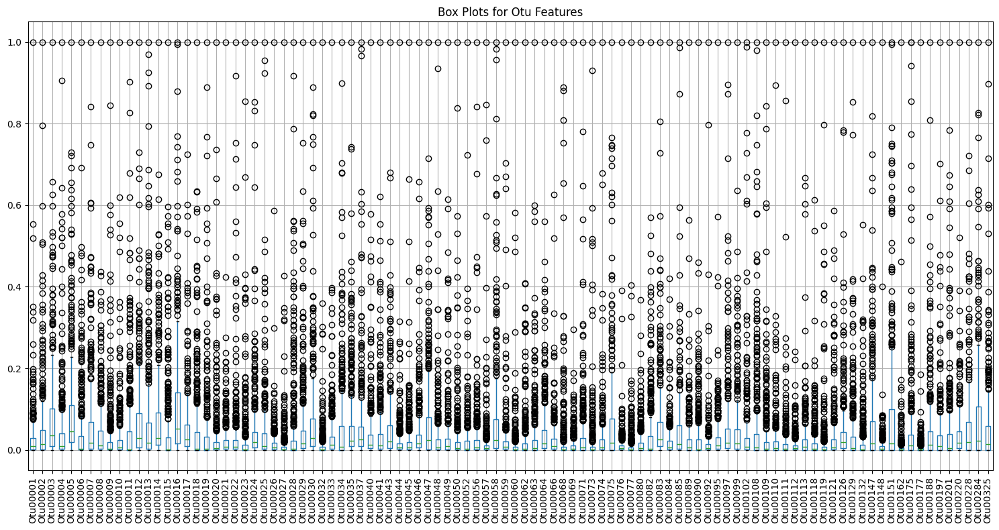

In [ ]:
boxplot(max_abs_scaled_part)

In [ ]:
outliers_df["original_count"].mean()

np.float64(50.96)

In [ ]:
outliers_df["robust_count"].mean()

np.float64(50.96)

In [ ]:
outliers_df["min_max_count"].mean()

np.float64(51.04)

In [ ]:
outliers_df["standard_count"].mean()

np.float64(51.08)

In [ ]:
outliers_df["max_abs_count"].mean()

np.float64(50.98)

⚠️ WARNING
* If you want to test SOM, use the second line of the following code.
* If you want to test SAE, use the third line of the following code.  

Just use one at a time. The results will change significantly if the wrong scaling is used.

In [ ]:
# Combine the scaled part with the unscaled part
scaled_data_df = pd.concat([df_to_keep, robust_scaled_part], axis=1) # SOM
# scaled_data_df = pd.concat([df_to_keep, max_abs_scaled_part], axis=1) # Autoencoder

print("First 5 rows of data scaled (selective scaling):")
display(scaled_data_df.head())

First 5 rows of data scaled (selective scaling):


,sex,city_Bogota,city_Bucaramanga,city_Cali,city_Medellin,age,Otu00001,Otu00002,Otu00003,Otu00004,...,Otu00162,Otu00175,Otu00177,Otu00188,Otu00197,Otu00201,Otu00220,Otu00228,Otu00284,Otu00325
MI_001_H,1,0,0,0,1,-0.277778,0.855738,0.033097,-0.351092,-0.240359,...,0.076923,5.1,0.1875,-0.285714,-0.250000,0.407407,-0.166667,-0.272727,-0.105263,0.041667
MI_002_H,0,0,0,0,1,-0.055556,0.245902,-0.285264,-0.280349,1.093274,...,1.384615,0.7,-0.0625,-0.142857,-0.083333,-0.111111,-0.083333,-0.272727,0.368421,3.458333
MI_003_H,1,0,0,0,1,0.666667,-0.242623,-0.220252,5.029694,-0.218834,...,-0.230769,-0.3,-0.1875,-0.285714,0.583333,5.037037,0.000000,-0.272727,-0.210526,-0.250000
MI_004_H,1,0,0,0,1,0.944444,0.560656,0.426714,-0.255895,-0.247085,...,-0.230769,-0.3,0.2500,-0.142857,0.333333,0.111111,-0.416667,-0.272727,-0.210526,-0.250000
MI_005_H,0,0,0,0,1,0.166667,-0.304918,-0.288022,-0.394760,-0.248879,...,-0.230769,4.9,0.1875,3.571429,-0.250000,-0.111111,2.916667,-0.272727,-0.210526,-0.250000


In [ ]:
scaled_data_df.describe()

,sex,city_Bogota,city_Bucaramanga,city_Cali,city_Medellin,age,Otu00001,Otu00002,Otu00003,Otu00004,...,Otu00162,Otu00175,Otu00177,Otu00188,Otu00197,Otu00201,Otu00220,Otu00228,Otu00284,Otu00325
count,441.000000,441.000000,441.000000,441.000000,441.00000,441.000000,441.000000,441.000000,441.000000,441.000000,...,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000
mean,0.480726,0.192744,0.179138,0.201814,0.22449,-0.017511,0.704204,0.719000,0.488037,0.928716,...,1.971743,1.078458,1.653770,0.737123,0.758692,1.009490,0.494520,0.600289,0.549827,0.697184
std,0.500196,0.394902,0.383904,0.401810,0.41772,0.616785,2.517383,2.065139,1.280238,2.781087,...,11.605318,3.471077,11.853381,2.160329,2.445489,2.764442,1.737905,1.602482,1.281365,1.848041
min,0.000000,0.000000,0.000000,0.000000,0.00000,-1.277778,-0.304918,-0.288810,-0.394760,-0.254260,...,-0.230769,-0.300000,-0.250000,-0.285714,-0.250000,-0.111111,-0.416667,-0.272727,-0.210526,-0.250000
25%,0.000000,0.000000,0.000000,0.000000,0.00000,-0.500000,-0.291803,-0.263199,-0.287336,-0.205830,...,-0.230769,-0.300000,-0.250000,-0.285714,-0.250000,-0.111111,-0.333333,-0.272727,-0.210526,-0.250000
50%,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,0.00000,0.500000,0.708197,0.736801,0.712664,0.794170,...,0.769231,0.700000,0.750000,0.714286,0.750000,0.888889,0.666667,0.727273,0.789474,0.750000
max,1.000000,1.000000,1.000000,1.000000,1.00000,1.166667,34.147541,20.425138,10.513537,25.559193,...,208.384615,27.100000,237.750000,21.714286,27.666667,25.407407,23.250000,14.454545,9.210526,16.875000


In [ ]:
negative_counts = (scaled_data_df < 0).sum()
total_rows = scaled_data_df.shape[0]
percentage_negative = (negative_counts / total_rows) * 100

for col in scaled_data_df.columns:
    count = negative_counts[col]
    percentage = percentage_negative[col]
    print(f"  {col}: {count} ({percentage:.2f}%)")

  sex: 0 (0.00%)
  city_Bogota: 0 (0.00%)
  city_Bucaramanga: 0 (0.00%)
  city_Cali: 0 (0.00%)
  city_Medellin: 0 (0.00%)
  age: 207 (46.94%)
  Otu00001: 220 (49.89%)
  Otu00002: 220 (49.89%)
  Otu00003: 220 (49.89%)
  Otu00004: 220 (49.89%)
  Otu00005: 220 (49.89%)
  Otu00006: 220 (49.89%)
  Otu00007: 220 (49.89%)
  Otu00008: 220 (49.89%)
  Otu00009: 219 (49.66%)
  Otu00010: 220 (49.89%)
  Otu00011: 219 (49.66%)
  Otu00012: 220 (49.89%)
  Otu00013: 218 (49.43%)
  Otu00014: 220 (49.89%)
  Otu00015: 220 (49.89%)
  Otu00016: 219 (49.66%)
  Otu00017: 220 (49.89%)
  Otu00018: 220 (49.89%)
  Otu00019: 220 (49.89%)
  Otu00020: 218 (49.43%)
  Otu00021: 219 (49.66%)
  Otu00022: 220 (49.89%)
  Otu00023: 217 (49.21%)
  Otu00024: 220 (49.89%)
  Otu00025: 218 (49.43%)
  Otu00026: 219 (49.66%)
  Otu00027: 218 (49.43%)
  Otu00028: 220 (49.89%)
  Otu00029: 219 (49.66%)
  Otu00030: 220 (49.89%)
  Otu00032: 220 (49.89%)
  Otu00033: 214 (48.53%)
  Otu00034: 220 (49.89%)
  Otu00035: 218 (49.43%)
  Otu000

In [ ]:
# If you want to test the SOM optimization, export these data to a CSV file which would be imported in the corresponding Jupyter notebook.
# scaled_data_df.to_csv("scaled_data_robust.csv", index=False)

In [ ]:
# Convert the DataFrame to a NumPy array
scaled_data = scaled_data_df.values

print("Type of scaled_data:")
print(type(scaled_data))
print("Shape of scaled_data:")
print(scaled_data.shape)
print("First 5 rows of the converted NumPy array:")
print(scaled_data[:5])

Type of scaled_data:
<class 'numpy.ndarray'>
Shape of scaled_data:
(441, 106)
First 5 rows of the converted NumPy array:
[[ 1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   1.00000000e+00 -2.77777778e-01  8.55737705e-01  3.30969267e-02
  -3.51091703e-01 -2.40358744e-01  2.96958855e-01  1.82088075e-01
   3.73029772e-01  7.24112962e-04 -1.20792079e-01  1.60734463e+00
   2.46981339e-01  1.63916392e-01 -2.12738854e-01 -6.93950178e-02
  -5.34351145e-02 -4.12500000e-01  2.40121581e-01  3.30787589e+00
  -9.85915493e-02  2.30288462e+00  5.90909091e-01  9.80392157e-02
  -6.45161290e-02  2.01398601e+00  4.50000000e-02 -3.19148936e-01
  -1.93548387e-01  2.41923077e+01  1.81415929e-01 -2.80303030e-01
  -6.57894737e-02  3.40000000e-01 -1.37362637e-01 -1.97916667e-01
   5.74193548e-01  4.54545455e-02  1.03958333e+01  6.49350649e-01
   8.18918919e+00  1.00000000e+00  3.61111111e-01  5.66473988e-01
   4.14634146e+00  2.23529412e+00  4.12698413e-01  9.38461538e-01
   6.45833333e-01  0.

## *SOM*

Please, run both scenarios since the second reuses functions from the first.

### Escenario 1

In [ ]:
# References: (Vettigli, 2025; Nanda, 2024)

# Hyperparameter #1: Grid size
# Decides the map’s size. The number of neurons in a map with a grid size of AxB is A*B.
SOM_X_AXIS_NODES  = 2
SOM_Y_AXIS_NODES  = 2
SOM_N_VARIABLES  = scaled_data.shape[1]
SOM_N_VARIABLES

106

In [ ]:
# Hyperparameter #5: Standard deviation
# Specifies the neighborhood function’s spread.
SIGMA0 = 1
# Hyperparameter #2: Learning rate
# Decides how much the weights are changed in each iteration.
# We set the initial learning rate, and it decreases over time according to the decay function.
ALPHA = 0.5
# Hyperparameter #4: Neighborhood function
# A mathematical function that specifies which neurons are to be considered as the BMU’s neighbors.
NEIGHBORHOOD_FUNC = 'gaussian'
DISTANCE_FUNC = 'chebyshev'
TOPOLOGY = 'rectangular'
# Hyperparameter #6: Sigma decay
# Controls how much the standard deviation is reduced in each subsequent iteration.
SIGMA_DECAY_FUNC = 'asymptotic_decay'
# Hyperparameter #3: Decay function
# Decides the extent to which the learning rate is decreased in each subsequent iteration.
DECAY_FUNC = 'asymptotic_decay'
RANDOM_SEED = 160 # 160

In [ ]:
som = MiniSom(
        SOM_X_AXIS_NODES,
        SOM_Y_AXIS_NODES,
        SOM_N_VARIABLES,
        sigma=SIGMA0,
        learning_rate=ALPHA,
        neighborhood_function=NEIGHBORHOOD_FUNC,
        activation_distance=DISTANCE_FUNC,
        topology=TOPOLOGY,
        sigma_decay_function = SIGMA_DECAY_FUNC,
        decay_function = DECAY_FUNC,
        random_seed=RANDOM_SEED,
        )

In [ ]:
som.random_weights_init(scaled_data)

In [ ]:
# Hyperparameter #7: Number of training iterations
# Decides how many times the weights are updated. In each training iteration, the neuron weights are updated once.
N_ITERATIONS = 925
som.train_random(scaled_data, N_ITERATIONS, verbose=True)

 [ 925 / 925 ] 100% - 0:00:00 left 
 quantization error: 34.3681728188853


In [ ]:
som.topographic_error(scaled_data)

np.float64(0.0)

In [ ]:
winner_coordinates = [som.winner(x) for x in scaled_data]
hit_map = np.zeros((SOM_X_AXIS_NODES, SOM_Y_AXIS_NODES))
for x, y in winner_coordinates:
    hit_map[x, y] += 1

In [ ]:
empty_nodes = np.sum(hit_map == 0)
active_nodes = np.sum(hit_map > 0)

print(f"Empty nodes: {empty_nodes}")
print(f"Active nodes: {active_nodes}")
print(f"Percentage active: {100 * active_nodes / (SOM_X_AXIS_NODES * SOM_Y_AXIS_NODES):.1f}%")
print(f"Samples per active node (avg): {len(scaled_data) / active_nodes:.0f}")

Empty nodes: 0
Active nodes: 4
Percentage active: 100.0%
Samples per active node (avg): 110


In [ ]:
W = som.get_weights()

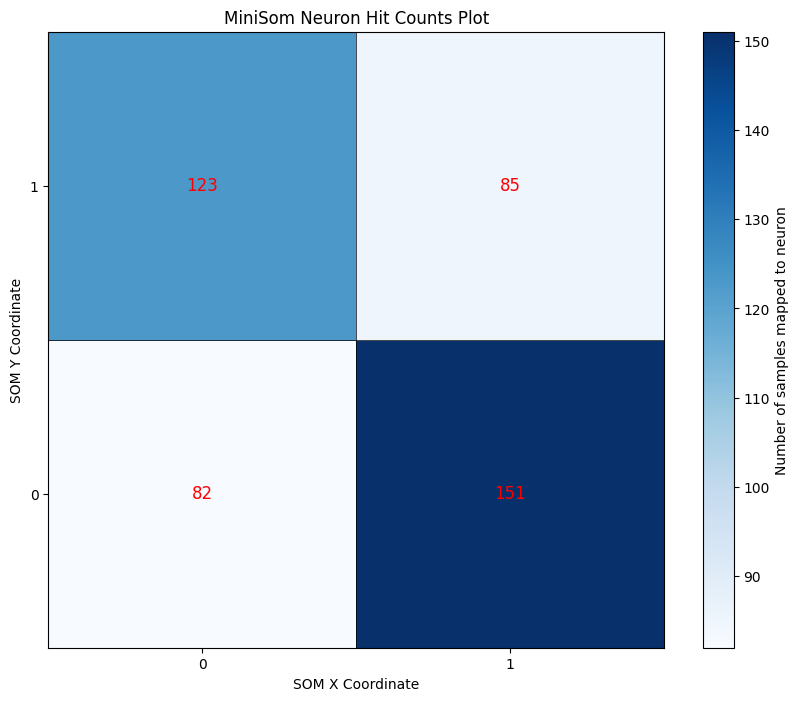

In [ ]:
# 4. Plot the results
plt.figure(figsize=(10, 8))

# Optional: Plot the distance map (U-matrix) as background
# plt.pcolor(som.distance_map().T, cmap='bone_r')
# plt.colorbar()

# Plot the hit counts on top of the map
plt.imshow(hit_map, cmap='Blues', interpolation='nearest', origin='lower')
plt.colorbar(label='Number of samples mapped to neuron')
plt.title('MiniSom Neuron Hit Counts Plot')
plt.xlabel('SOM X Coordinate')
plt.ylabel('SOM Y Coordinate')

# Set integer ticks centered on each cell
plt.xticks(np.arange(SOM_X_AXIS_NODES))
plt.yticks(np.arange(SOM_Y_AXIS_NODES))
# Ensure labels are integers
plt.gca().set_xticklabels(np.arange(SOM_X_AXIS_NODES))
plt.gca().set_yticklabels(np.arange(SOM_Y_AXIS_NODES))

# Add grid lines BETWEEN the neurons (at -0.5, 0.5, 1.5, ...)
plt.gca().set_xticks(np.arange(SOM_X_AXIS_NODES + 1) - 0.5, minor=True)
plt.gca().set_yticks(np.arange(SOM_Y_AXIS_NODES + 1) - 0.5, minor=True)
plt.grid(which='minor', color='black', linestyle='-', linewidth=0.5) # Draw grid using minor ticks
plt.tick_params(which='minor', length=0) # Hide the minor tick marks themselves

# Add text labels for counts
for i in range(SOM_Y_AXIS_NODES): # Iterate over y-axis (rows)
    for j in range(SOM_X_AXIS_NODES): # Iterate over x-axis (columns)
        plt.text(j, i, int(hit_map[i, j]), ha='center', va='center', color='red', fontsize=12)

plt.show()

In [ ]:
binary_cols = ['sex', 'city_Bogota', 'city_Bucaramanga', 'city_Cali', 'city_Medellin']
continuous_cols = [col for col in df_pandas_encoded.columns if col not in binary_cols]

In [ ]:
# Get cluster assignments from SOM
winners = np.array([som.winner(x) for x in scaled_data])
cluster_ids = winners[:, 0] * SOM_Y_AXIS_NODES + winners[:, 1]  # Flatten to 1D

# Calculate mutual information between each feature and clusters
mi_scores = []

for i, feature_name in enumerate(scaled_data_df.columns.values):
    feature_values = scaled_data[:, i]

    # Discretize continuous features for MI calculation
    if feature_name not in binary_cols:
        feature_discrete = np.digitize(feature_values,
                                      bins=np.percentile(feature_values, [0, 25, 50, 75, 100]))
    else:
        feature_discrete = feature_values

    mi = mutual_info_score(cluster_ids, feature_discrete)

    mi_scores.append({
        'feature': feature_name,
        'type': 'binary' if feature_name in binary_cols else 'continuous',
        'mutual_info': mi
    })

mi_df = pd.DataFrame(mi_scores).sort_values('mutual_info', ascending=False)

print("="*70)
print("MUTUAL INFORMATION: Feature vs SOM Clusters")
print("="*70)
print(mi_df.head(20))

# Check if binary features are completely ignored
binary_mi = mi_df[mi_df['type'] == 'binary']['mutual_info'].mean()
continuous_mi = mi_df[mi_df['type'] == 'continuous']['mutual_info'].mean()

print(f"\nAverage MI - Binary: {binary_mi:.4f}")
print(f"Average MI - Continuous: {continuous_mi:.4f}")
print(f"Ratio (Continuous/Binary): {continuous_mi/binary_mi:.2f}x")

if continuous_mi / binary_mi > 10:
    print("\n⚠️  WARNING: Continuous features dominate clustering (>10x more influence)")
    print("Consider scaling binary features if you want them to have more influence")
elif continuous_mi / binary_mi > 3:
    print("\n✓ Continuous features have moderate advantage (3-10x more influence)")
    print("This is typical and often acceptable")
else:
    print("\n✓ Binary and continuous features have similar influence")

MUTUAL INFORMATION: Feature vs SOM Clusters
     feature        type  mutual_info
44  Otu00044  continuous     0.055463
64  Otu00073  continuous     0.052521
54  Otu00058  continuous     0.052293
30  Otu00025  continuous     0.049857
50  Otu00050  continuous     0.046727
97  Otu00175  continuous     0.046688
27  Otu00022  continuous     0.044093
52  Otu00056  continuous     0.039461
49  Otu00049  continuous     0.039122
14  Otu00009  continuous     0.038839
43  Otu00043  continuous     0.038781
80  Otu00102  continuous     0.038240
68  Otu00077  continuous     0.036807
87  Otu00118  continuous     0.035988
69  Otu00080  continuous     0.035816
89  Otu00121  continuous     0.035330
71  Otu00083  continuous     0.035252
32  Otu00027  continuous     0.035194
78  Otu00097  continuous     0.034524
11  Otu00006  continuous     0.034136

Average MI - Binary: 0.0140
Average MI - Continuous: 0.0242
Ratio (Continuous/Binary): 1.74x

✓ Binary and continuous features have similar influence


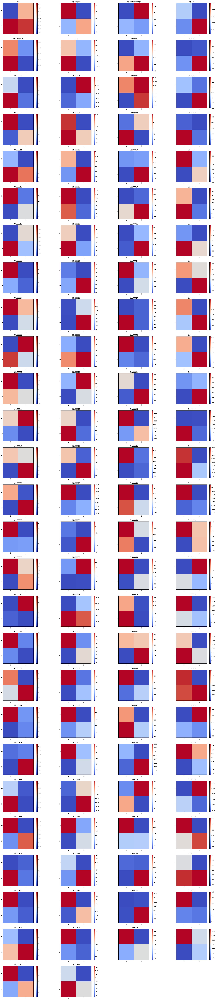

In [ ]:
plt.figure(figsize=(30, 150))
for i, f in enumerate(list(scaled_data_df.columns.values)):
    plt.subplot(30, 4, i+1)
    plt.title(f)
    plt.pcolor(W[:,:,i].T, cmap='coolwarm')

    # Center tick labels on squares, starting from 0
    plt.xticks(np.arange(SOM_X_AXIS_NODES) + 0.5, np.arange(SOM_X_AXIS_NODES))
    plt.yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5, np.arange(SOM_Y_AXIS_NODES))

    # Make each matrix visually square
    plt.gca().set_aspect('equal', adjustable='box')

    plt.colorbar()
plt.show()

In [ ]:
# Normalize each feature independently to [0, 1]
W_normalized = np.zeros_like(W)

for i in range(W.shape[2]):
    feature_weights = W[:, :, i]
    w_min = feature_weights.min()
    w_max = feature_weights.max()

    if w_max > w_min:  # Avoid division by zero
        W_normalized[:, :, i] = (feature_weights - w_min) / (w_max - w_min)
    else:
        W_normalized[:, :, i] = 0.5  # Uniform feature

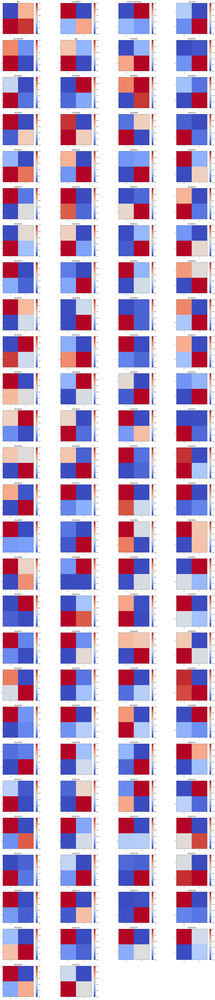

In [ ]:
plt.figure(figsize=(30, 150))
for i, f in enumerate(list(scaled_data_df.columns.values)):
    plt.subplot(30, 4, i+1)
    plt.title(f)
    plt.pcolor(W_normalized[:,:,i].T, cmap='coolwarm')

    # Center tick labels on squares, starting from 0
    plt.xticks(np.arange(SOM_X_AXIS_NODES) + 0.5, np.arange(SOM_X_AXIS_NODES))
    plt.yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5, np.arange(SOM_Y_AXIS_NODES))

    # Make each matrix visually square
    plt.gca().set_aspect('equal', adjustable='box')

    plt.colorbar()
plt.show()

In [ ]:
# Complete feature importance analysis
feature_names = list(scaled_data_df.columns)

binary_features = ['sex', 'city_Bogota', 'city_Bucaramanga', 'city_Cali', 'city_Medellin']
continuous_features = [f for f in feature_names if f not in binary_features]

In [ ]:
def plot_component_planes_comprehensive(W, W_normalized, feature_names, top_n=None):
    """
    Plot component planes showing both original and normalized scales.
    """
    features_to_plot = [{'feature': name, 'feature_index': i} for i, name in enumerate(feature_names)]

    n_features = len(features_to_plot)
    n_cols = 2
    n_rows = n_features
    fig = plt.figure(figsize=(15, 5*n_rows + 1))

    for idx, feature_info in enumerate(features_to_plot):
        feature_idx = feature_info['feature_index']
        feature_name = feature_info['feature']

        # Column 1: Original scale
        ax1 = plt.subplot(n_rows, n_cols, idx*n_cols + 1)
        im1 = ax1.pcolor(W[:, :, feature_idx].T, cmap='coolwarm',
                        edgecolors='gray', linewidth=0.3)
        # Center tick labels on squares, starting from 0
        ax1.set_xticks(np.arange(SOM_X_AXIS_NODES) + 0.5)
        ax1.set_xticklabels(np.arange(SOM_X_AXIS_NODES))
        ax1.set_yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5)
        ax1.set_yticklabels(np.arange(SOM_Y_AXIS_NODES))
        # Make matrix square
        ax1.set_aspect('equal', adjustable='box')
        ax1.set_title(f'{feature_name}\n(Original Scale)', fontsize=10, pad=8)
        plt.colorbar(im1, ax=ax1, label='Original Weight')

        # Column 2: Normalized scale
        ax2 = plt.subplot(n_rows, n_cols, idx*n_cols + 2)
        im2 = ax2.pcolor(W_normalized[:, :, feature_idx].T,
                        cmap='coolwarm', vmin=0, vmax=1,
                        edgecolors='gray', linewidth=0.3)
        # Center tick labels on squares, starting from 0
        ax2.set_xticks(np.arange(SOM_X_AXIS_NODES) + 0.5)
        ax2.set_xticklabels(np.arange(SOM_X_AXIS_NODES))
        ax2.set_yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5)
        ax2.set_yticklabels(np.arange(SOM_Y_AXIS_NODES))
        # Make matrix square
        ax2.set_aspect('equal', adjustable='box')
        ax2.set_title(f'{feature_name}\n(Normalized 0-1)', fontsize=10, pad=8)
        plt.colorbar(im2, ax=ax2, label='Normalized')

    fig.suptitle('Component Planes Analysis: Original vs. Normalized Scales',
                fontsize=16, fontweight='bold', y=0.99)
    fig.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()

# Use it with all features
plot_component_planes_comprehensive(W, W_normalized, feature_names)

In [ ]:
def comprehensive_feature_importance(W, feature_names, binary_features):
    """
    Comprehensive importance analysis with multiple metrics.
    """
    results = []

    for i, feature in enumerate(feature_names):
        feature_weights_grid = W[:, :, i]
        all_weights = feature_weights_grid.flatten()

        is_binary = feature in binary_features

        # Calculate multiple metrics
        total_range = all_weights.max() - all_weights.min()
        total_variance = all_weights.var()

        results.append({
            'feature': feature,
            'original_index': i,
            'type': 'binary' if is_binary else 'continuous',
            'total_range': total_range,
            'total_variance': total_variance
        })

    df = pd.DataFrame(results)

    # Generate composite importance score
    # Normalize each metric within type, then average
    for ftype in ['binary', 'continuous']:
        mask = df['type'] == ftype

        if mask.sum() > 0:
            # Normalize total_range
            range_vals = df.loc[mask, 'total_range']
            if range_vals.max() > range_vals.min():
                df.loc[mask, 'norm_range'] = (range_vals - range_vals.min()) / \
                                             (range_vals.max() - range_vals.min())
            else:
                df.loc[mask, 'norm_range'] = 0.5

            # Normalize total_variance
            var_vals = df.loc[mask, 'total_variance']
            if var_vals.max() > var_vals.min():
                df.loc[mask, 'norm_variance'] = (var_vals - var_vals.min()) / \
                                                (var_vals.max() - var_vals.min())
            else:
                df.loc[mask, 'norm_variance'] = 0.5

    # Composite score: average of normalized metrics
    df['composite_importance'] = (df['norm_variance'] + df['norm_range']) / 2

    df = df.sort_values('composite_importance', ascending=False)
    df['rank'] = range(1, len(df) + 1)

    return df

# Calculate comprehensive importance
importance_df = comprehensive_feature_importance(
    W, feature_names, binary_features
)

print("\n" + "="*80)
print("COMPREHENSIVE FEATURE IMPORTANCE ANALYSIS")
print("="*80)
print(importance_df[['feature', 'type', 'total_range', 'total_variance',
                       'composite_importance', 'rank']].head(20))

# Separate rankings
print("\n" + "="*80)
print("TOP BINARY FEATURES")
print("="*80)
binary_top = importance_df[importance_df['type'] == 'binary'].head(2)
print(binary_top[['feature', 'total_variance', 'composite_importance']])

print("\n" + "="*80)
print("TOP CONTINUOUS FEATURES")
print("="*80)
continuous_top = importance_df[importance_df['type'] == 'continuous'].head(15)
print(continuous_top[['feature', 'total_range', 'total_variance', 'composite_importance']])


COMPREHENSIVE FEATURE IMPORTANCE ANALYSIS
             feature        type  total_range  total_variance  \
2   city_Bucaramanga      binary     0.503318        0.036335   
98          Otu00177  continuous    18.132657       60.647700   
1        city_Bogota      binary     0.458858        0.031521   
28          Otu00023  continuous     7.424406        8.813186   
4      city_Medellin      binary     0.265647        0.012286   
61          Otu00068  continuous     6.655399        7.536021   
64          Otu00073  continuous     6.194799        6.975729   
56          Otu00060  continuous     6.050069        5.423327   
96          Otu00162  continuous     5.386178        4.792335   
14          Otu00009  continuous     5.381617        4.711117   
23          Otu00018  continuous     4.253193        3.078135   
50          Otu00050  continuous     4.217634        3.032077   
3          city_Cali      binary     0.235970        0.008065   
34          Otu00029  continuous     4.063724  

In [ ]:
top_to_analyze = 15

TOP 15 MOST IMPORTANT FEATURES
         feature  original_index       type  total_range  total_variance  norm_range  norm_variance  composite_importance  rank
city_Bucaramanga               2     binary     0.503318        0.036335    1.000000       1.000000              1.000000     1
        Otu00177              98 continuous    18.132657       60.647700    1.000000       1.000000              1.000000     2
     city_Bogota               1     binary     0.458858        0.031521    0.862904       0.846000              0.854452     3
        Otu00023              28 continuous     7.424406        8.813186    0.405693       0.145289              0.275491     4
   city_Medellin               4     binary     0.265647        0.012286    0.267108       0.230613              0.248861     5
        Otu00068              61 continuous     6.655399        7.536021    0.363014       0.124229              0.243621     6
        Otu00073              64 continuous     6.194799        6.975729 

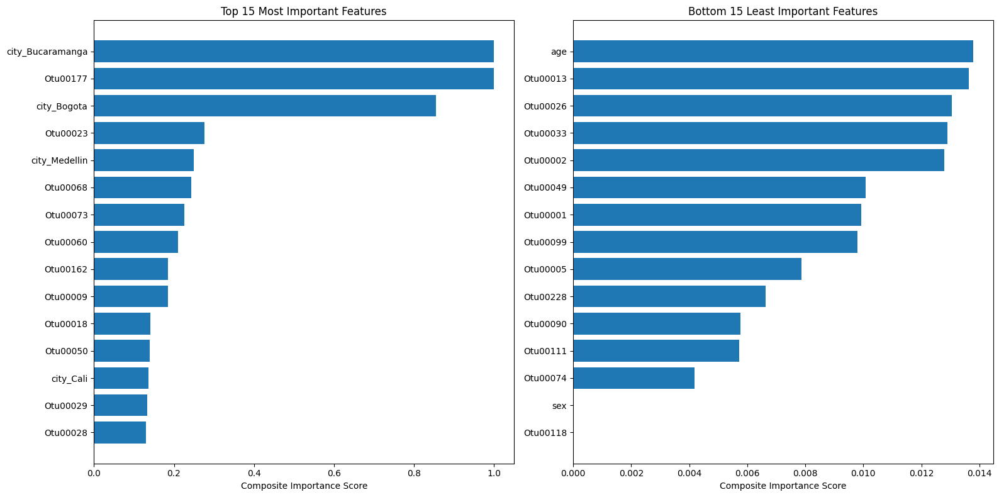

In [ ]:
# Show top important features
print("="*70)
print("TOP " + str(top_to_analyze) + " MOST IMPORTANT FEATURES")
print("="*70)
print(importance_df.head(top_to_analyze).to_string(index=False))

print("\n" + "="*70)
print("BOTTOM " + str(top_to_analyze) + " LEAST IMPORTANT FEATURES")
print("="*70)
print(importance_df.tail(top_to_analyze).to_string(index=False))

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].barh(range(top_to_analyze), importance_df['composite_importance'].head(top_to_analyze))
axes[0].set_yticks(range(top_to_analyze))
axes[0].set_yticklabels(importance_df['feature'].head(top_to_analyze))
axes[0].set_xlabel('Composite Importance Score')
axes[0].set_title('Top ' + str(top_to_analyze) + ' Most Important Features')
axes[0].invert_yaxis()

axes[1].barh(range(top_to_analyze), importance_df['composite_importance'].tail(top_to_analyze))
axes[1].set_yticks(range(top_to_analyze))
axes[1].set_yticklabels(importance_df['feature'].tail(top_to_analyze))
axes[1].set_xlabel('Composite Importance Score')
axes[1].set_title('Bottom ' + str(top_to_analyze) + ' Least Important Features')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()

In [ ]:
top_15_2x2_df = importance_df.sort_values('composite_importance', ascending=False).head(top_to_analyze)
top_15_2x2_df.reset_index(drop=True, inplace=True)
top_15_2x2_df

,feature,original_index,type,total_range,total_variance,norm_range,norm_variance,composite_importance,rank
0,city_Bucaramanga,2,binary,0.503318,0.036335,1.000000,1.000000,1.000000,1
1,Otu00177,98,continuous,18.132657,60.647700,1.000000,1.000000,1.000000,2
2,city_Bogota,1,binary,0.458858,0.031521,0.862904,0.846000,0.854452,3
3,Otu00023,28,continuous,7.424406,8.813186,0.405693,0.145289,0.275491,4
4,city_Medellin,4,binary,0.265647,0.012286,0.267108,0.230613,0.248861,5
5,Otu00068,61,continuous,6.655399,7.536021,0.363014,0.124229,0.243621,6
6,Otu00073,64,continuous,6.194799,6.975729,0.337450,0.114990,0.226220,7
7,Otu00060,56,continuous,6.050069,5.423327,0.329418,0.089393,0.209405,8
8,Otu00162,96,continuous,5.386178,4.792335,0.292572,0.078988,0.185780,9
9,Otu00009,14,continuous,5.381617,4.711117,0.292319,0.077649,0.184984,10


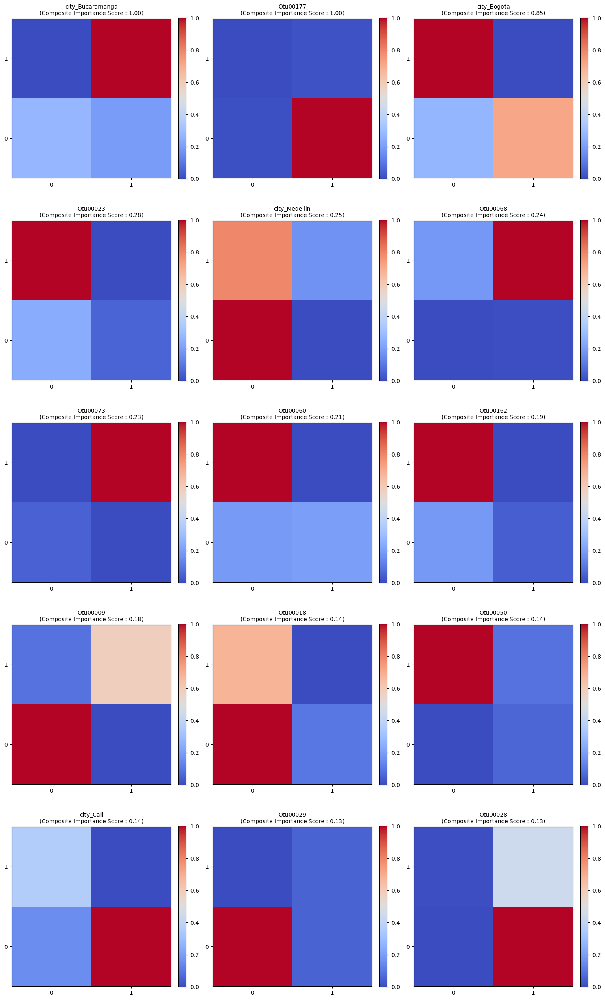

In [ ]:
top_features = importance_df.head(top_to_analyze)

# Plot only the most important features
top_feature_indices = top_features['original_index'].values
top_feature_names = top_features['feature'].values

n_features = len(top_feature_indices)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

plt.figure(figsize=(15, 5 * n_rows))

for i, (idx, name) in enumerate(zip(top_feature_indices, top_feature_names)):
    plt.subplot(n_rows, n_cols, i+1)
    plt.title(f'{name}\n(Composite Importance Score : {top_features.iloc[i]["composite_importance"]:.2f})', fontsize=10)
    plt.pcolor(W_normalized[:,:,idx].T, cmap='coolwarm')

    # Center tick labels on squares, starting from 0
    plt.xticks(np.arange(SOM_X_AXIS_NODES) + 0.5, np.arange(SOM_X_AXIS_NODES))
    plt.yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5, np.arange(SOM_Y_AXIS_NODES))

    # Make each matrix visually square
    plt.gca().set_aspect('equal', adjustable='box')

    plt.colorbar(fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

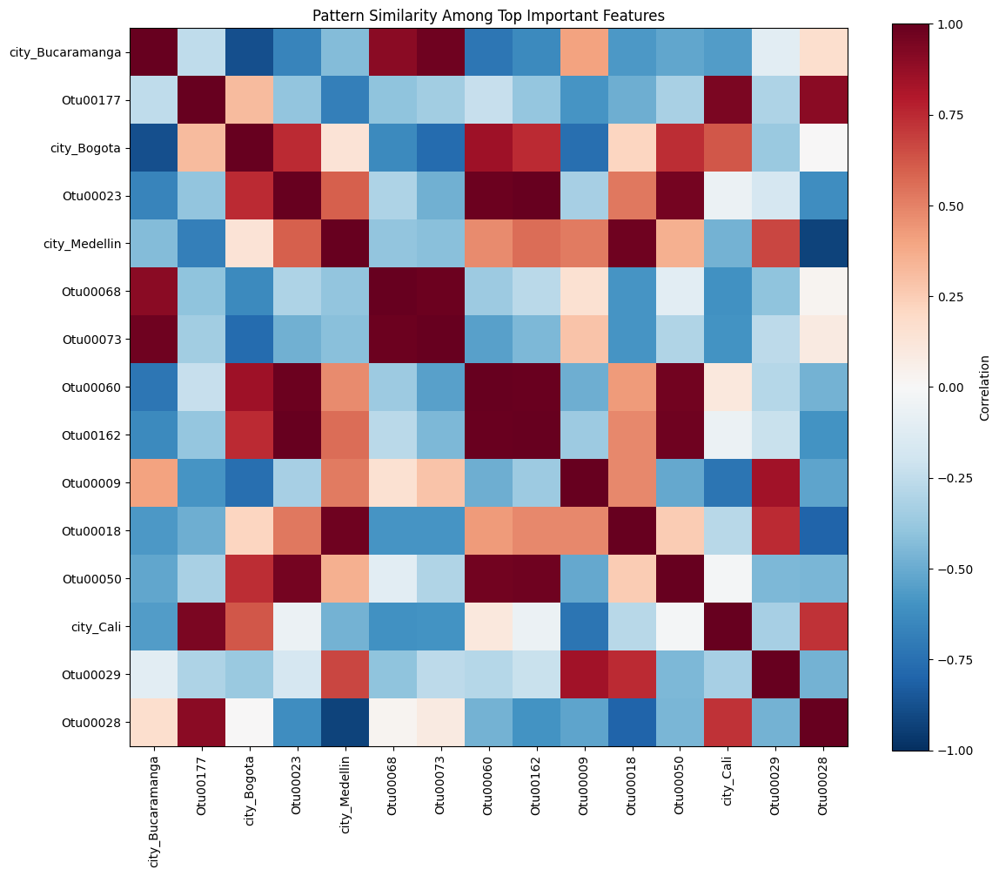

In [ ]:
# Group features by similar patterns
# Features with similar component planes are correlated

# Calculate correlation between component planes
n_top = len(top_feature_indices)
pattern_similarity = np.zeros((n_top, n_top))

for i in range(n_top):
    for j in range(n_top):
        idx_i = top_feature_indices[i]
        idx_j = top_feature_indices[j]

        weights_i = W[:,:,idx_i].flatten()
        weights_j = W[:,:,idx_j].flatten()

        # Correlation between the two component planes
        pattern_similarity[i, j] = np.corrcoef(weights_i, weights_j)[0, 1]

# Visualize pattern similarity
plt.figure(figsize=(12, 10))
plt.imshow(pattern_similarity, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(label='Correlation')
plt.xticks(range(n_top), top_feature_names, rotation=90)
plt.yticks(range(n_top), top_feature_names)
plt.title('Pattern Similarity Among Top Important Features')
plt.tight_layout()
plt.show()

#### Dendrograma

In [ ]:
def distance_symmetric_matrix(pattern_similarity):
    # Convert correlation to distance
    distance_matrix = 1 - np.abs(pattern_similarity)
    # Force symmetry
    distance_matrix = (distance_matrix + distance_matrix.T) / 2
    # Zero diagonal (required for distance matrices)
    np.fill_diagonal(distance_matrix, 0)
    condensed_dist = squareform(distance_matrix)
    return distance_matrix, condensed_dist

distance_matrix, condensed_dist = distance_symmetric_matrix(pattern_similarity)

In [ ]:
# Test all linkage methods
methods = ['single', 'complete', 'average', 'weighted', 'centroid', 'median', 'ward'] # Reference: (SciPy, s.f.)
results = []

print("="*70)
print("COPHENETIC CORRELATION - Higher is Better (closer to 1)")
print("="*70)

for method in methods:
    try:
        linkage_matrix = linkage(condensed_dist, method=method)

        # Calculate cophenetic correlation
        coph_corr, coph_dist = cophenet(linkage_matrix, condensed_dist)

        results.append({
            'method': method,
            'cophenetic_correlation': coph_corr
        })

        print(f"{method.upper():12s}: {coph_corr:.4f}")

    except Exception as e:
        print(f"{method.upper():12s}: Failed ({str(e)})")

# Find best method
results_df = pd.DataFrame(results)
best_method = results_df.loc[results_df['cophenetic_correlation'].idxmax(), 'method']

print("="*70)
print(f"BEST METHOD: {best_method.upper()} (Cophenetic = {results_df['cophenetic_correlation'].max():.4f})")
print("="*70)

COPHENETIC CORRELATION - Higher is Better (closer to 1)
SINGLE      : 0.6927
COMPLETE    : 0.7481
AVERAGE     : 0.7629
WEIGHTED    : 0.7464
CENTROID    : 0.7429
MEDIAN      : 0.7531
WARD        : 0.7446
BEST METHOD: AVERAGE (Cophenetic = 0.7629)


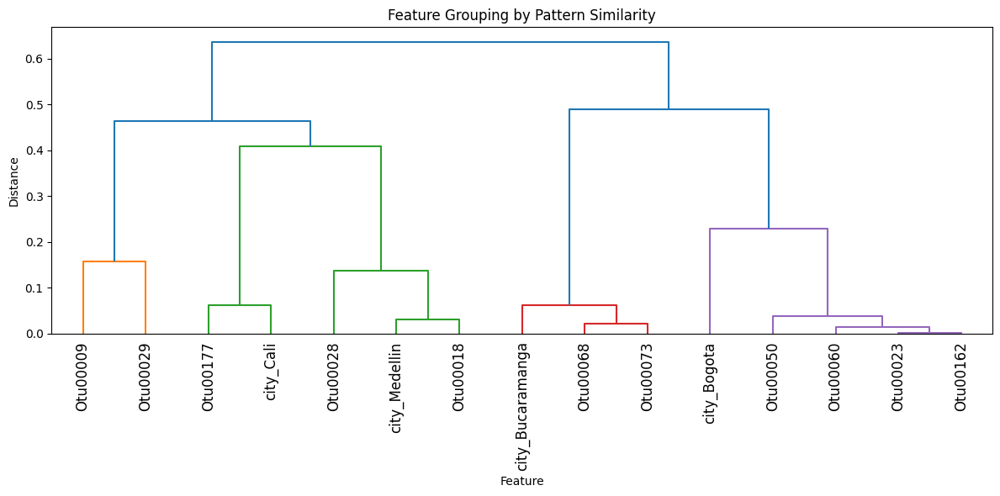

In [ ]:
# Hierarchical clustering
linkage_matrix = linkage(condensed_dist, method='average')

plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, labels=top_feature_names, leaf_rotation=90)
plt.title('Feature Grouping by Pattern Similarity')
plt.xlabel('Feature')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

TESTING DIFFERENT VALUES OF k
k= 2 | Sil=0.476 | DB=2.204 | CH=   1.9 | Balance=0.07 | Sizes=[7, 8]
k= 3 | Sil=0.555 | DB=1.551 | CH=   2.2 | Balance=0.33 | Sizes=[7, 3, 5]
k= 4 | Sil=0.611 | DB=1.415 | CH=   2.1 | Balance=0.35 | Sizes=[2, 5, 3, 5]
k= 5 | Sil=0.708 | DB=1.423 | CH=   2.6 | Balance=0.37 | Sizes=[2, 2, 3, 3, 5]
k=6: Some clusters have too few samples. Skipping score calculation.
k= 6 | Sil=nan | DB=nan | CH=   nan | Balance=0.38 | Sizes=[2, 2, 3, 3, 4, 1]
k=7: Some clusters have too few samples. Skipping score calculation.
k= 7 | Sil=nan | DB=nan | CH=   nan | Balance=0.52 | Sizes=[1, 1, 2, 3, 3, 4, 1]
k=8: Some clusters have too few samples. Skipping score calculation.
k= 8 | Sil=nan | DB=nan | CH=   nan | Balance=0.56 | Sizes=[1, 1, 2, 2, 1, 3, 4, 1]
k=9: Some clusters have too few samples. Skipping score calculation.
k= 9 | Sil=nan | DB=nan | CH=   nan | Balance=0.63 | Sizes=[1, 1, 1, 1, 2, 1, 3, 4, 1]
k=10: Some clusters have too few samples. Skipping score calculati

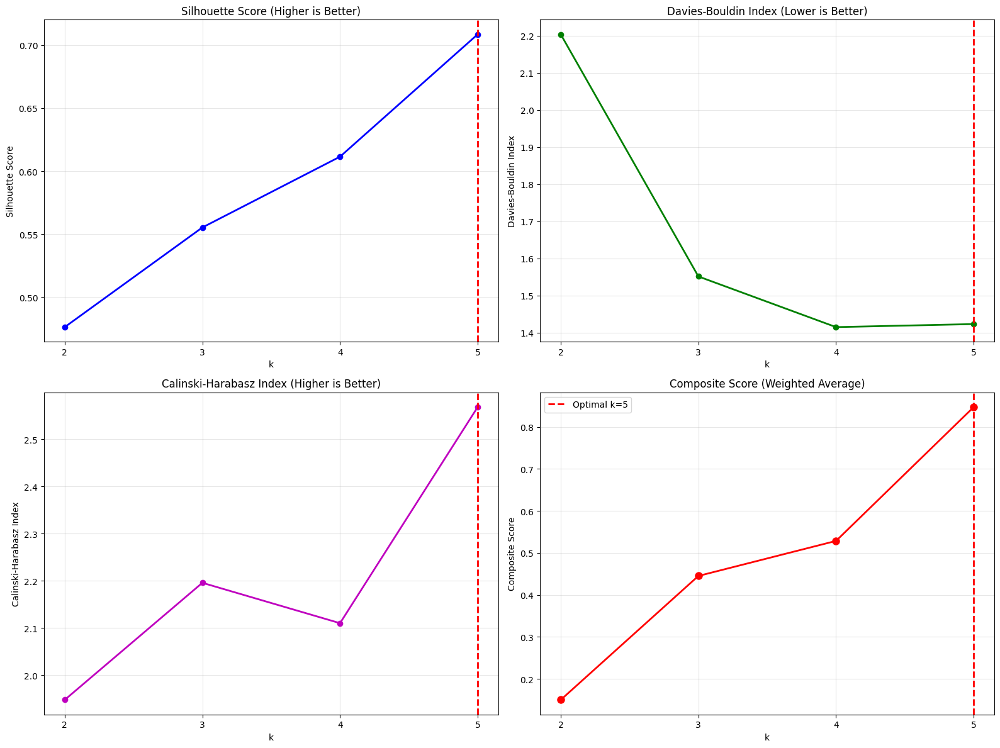

In [ ]:
from matplotlib.ticker import MaxNLocator

def find_optimal_k_consensus(distance_matrix, linkage_matrix, W, top_feature_indices,
                             max_k=15, methods_to_use='all'):
    """
    Find optimal k using multiple metrics and return consensus.
    """
    feature_vectors = np.array([W[:,:,idx].flatten() for idx in top_feature_indices])
    n_features = len(top_feature_indices)

    # Ensure max_k is valid: at least 2 clusters and at most n_samples - 1
    # silhouette_score needs at least 2 samples in the mask and n_clusters > 1
    # The error message implies n_labels must be 2 to n_samples - 1.
    # So if n_features is small, max_k should be adjusted.
    max_k = min(max_k, n_features - 1)
    if max_k < 2: # No valid k to test
        print("Not enough features/samples to perform clustering for k >= 2.")
        return None, None

    results = []

    print("="*80)
    print("TESTING DIFFERENT VALUES OF k")
    print("="*80)

    for k in range(2, max_k + 1):
        cluster_labels = fcluster(linkage_matrix, k, criterion='maxclust')

        # Calculate n_clusters directly from cluster_labels for robust check
        actual_n_clusters = len(np.unique(cluster_labels))

        sil_score = np.nan
        db_score = np.nan
        ch_score = np.nan

        # silhouette_score needs at least 2 clusters and at least 2 samples per cluster
        # davies_bouldin_score and calinski_harabasz_score also need at least 2 clusters
        if actual_n_clusters > 1 and np.min(np.bincount(cluster_labels - 1)) >= 2: # check if at least 2 samples per cluster (for silhouette)
             try:
                 sil_score = silhouette_score(distance_matrix, cluster_labels, metric='precomputed')
                 db_score = davies_bouldin_score(feature_vectors, cluster_labels)
                 ch_score = calinski_harabasz_score(feature_vectors, cluster_labels)
             except ValueError as e:
                 # Catch potential errors from metrics if clusters are pathological
                 print(f"Warning: Could not calculate metrics for k={k} due to: {e}")
        elif actual_n_clusters < 2:
            print(f"k={k}: Only 1 or 0 effective cluster formed by fcluster. Skipping score calculation.")
        else: # actual_n_clusters > 1 but min_samples_per_cluster < 2
            print(f"k={k}: Some clusters have too few samples. Skipping score calculation.")

        # Check cluster balance (avoid one huge cluster)
        unique, counts = np.unique(cluster_labels, return_counts=True)
        # Handle case where counts might be all zeros or single element after filtering
        balance = counts.std() / counts.mean() if counts.mean() > 0 else np.nan
        min_size = counts.min()
        max_size = counts.max()

        results.append({
            'k': k,
            'silhouette': sil_score,
            'davies_bouldin': db_score,
            'calinski_harabasz': ch_score,
            'balance_score': balance,
            'min_cluster_size': min_size,
            'max_cluster_size': max_size
        })

        print(f"k={k:2d} | Sil={sil_score:.3f} | DB={db_score:.3f} | "
              f"CH={ch_score:6.1f} | Balance={balance:.2f} | Sizes={counts.tolist()}")

    results_df = pd.DataFrame(results)

    # Drop rows where all scores are NaN (meaning no valid clustering was found)
    results_df.dropna(subset=['silhouette', 'davies_bouldin', 'calinski_harabasz'], how='all', inplace=True)

    if results_df.empty:
        print("\nNo valid clustering configurations found (all metrics were N/A).")
        return None, None

    # Normalize metrics for ranking (0-1 scale)
    # Handle cases where min/max might be NaN or min == max

    # Silhouette (higher is better)
    sil_min, sil_max = results_df['silhouette'].min(), results_df['silhouette'].max()
    if not pd.isna(sil_min) and not pd.isna(sil_max) and sil_max > sil_min:
        results_df['sil_norm'] = (results_df['silhouette'] - sil_min) / (sil_max - sil_min)
    else:
        results_df['sil_norm'] = 0.5 # Default to neutral if no variance

    # Davies-Bouldin (lower is better)
    db_min, db_max = results_df['davies_bouldin'].min(), results_df['davies_bouldin'].max()
    if not pd.isna(db_min) and not pd.isna(db_max) and db_max > db_min:
        results_df['db_norm'] = 1 - ((results_df['davies_bouldin'] - db_min) / (db_max - db_min))
    else:
        results_df['db_norm'] = 0.5

    # Calinski-Harabasz (higher is better)
    ch_min, ch_max = results_df['calinski_harabasz'].min(), results_df['calinski_harabasz'].max()
    if not pd.isna(ch_min) and not pd.isna(ch_max) and ch_max > ch_min:
        results_df['ch_norm'] = (results_df['calinski_harabasz'] - ch_min) / (ch_max - ch_min)
    else:
        results_df['ch_norm'] = 0.5

    # Penalize imbalanced clusters (lower balance_score is better, so higher norm is better)
    balance_min, balance_max = results_df['balance_score'].min(), results_df['balance_score'].max()
    if not pd.isna(balance_min) and not pd.isna(balance_max) and balance_max > balance_min:
        results_df['balance_norm'] = 1 - ((results_df['balance_score'] - balance_min) / (balance_max - balance_min))
    else:
        results_df['balance_norm'] = 0.5


    # Composite score (weighted average)
    # Fill any remaining NaNs in normalized scores with 0.5 (neutral) before calculating composite
    results_df[['sil_norm', 'db_norm', 'ch_norm', 'balance_norm']] = \
        results_df[['sil_norm', 'db_norm', 'ch_norm', 'balance_norm']].fillna(0.5)

    results_df['composite_score'] = (
        0.35 * results_df['sil_norm'] +      # Silhouette (most important)
        0.25 * results_df['db_norm'] +       # Davies-Bouldin
        0.25 * results_df['ch_norm'] +       # Calinski-Harabasz
        0.15 * results_df['balance_norm']    # Balance
    )

    # Find optimal k
    optimal_row = results_df.loc[results_df['composite_score'].idxmax()]
    optimal_k = int(optimal_row['k'])

    print("\n" + "="*80)
    print("RANKINGS")
    print("="*80)
    print(f"Best by Silhouette:        k={results_df.loc[results_df['silhouette'].idxmax(), 'k']:.0f}")
    print(f"Best by Davies-Bouldin:    k={results_df.loc[results_df['davies_bouldin'].idxmin(), 'k']:.0f}")
    print(f"Best by Calinski-Harabasz: k={results_df.loc[results_df['calinski_harabasz'].idxmax(), 'k']:.0f}")
    print(f"Best by Balance:           k={results_df.loc[results_df['balance_score'].idxmin(), 'k']:.0f}")

    print("\n" + "="*80)
    print(f"RECOMMENDED k: {optimal_k} (Composite Score = {optimal_row['composite_score']:.3f})")
    print("="*80)

    # Visualize
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Silhouette
    ax1 = axes[0, 0]
    ax1.plot(results_df['k'], results_df['silhouette'], 'bo-', linewidth=2, markersize=6)
    ax1.axvline(x=optimal_k, color='red', linestyle='--', linewidth=2)
    ax1.set_xlabel('k')
    ax1.set_ylabel('Silhouette Score')
    ax1.set_title('Silhouette Score (Higher is Better)')
    ax1.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax1.grid(True, alpha=0.3)

    # Davies-Bouldin
    ax2 = axes[0, 1]
    ax2.plot(results_df['k'], results_df['davies_bouldin'], 'go-', linewidth=2, markersize=6)
    ax2.axvline(x=optimal_k, color='red', linestyle='--', linewidth=2)
    ax2.set_xlabel('k')
    ax2.set_ylabel('Davies-Bouldin Index')
    ax2.set_title('Davies-Bouldin Index (Lower is Better)')
    ax2.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax2.grid(True, alpha=0.3)

    # Calinski-Harabasz
    ax3 = axes[1, 0]
    ax3.plot(results_df['k'], results_df['calinski_harabasz'], 'mo-', linewidth=2, markersize=6)
    ax3.axvline(x=optimal_k, color='red', linestyle='--', linewidth=2)
    ax3.set_xlabel('k')
    ax3.set_ylabel('Calinski-Harabasz Index')
    ax3.set_title('Calinski-Harabasz Index (Higher is Better)')
    ax3.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax3.grid(True, alpha=0.3)

    # Composite Score
    ax4 = axes[1, 1]
    ax4.plot(results_df['k'], results_df['composite_score'], 'ro-', linewidth=2, markersize=8)
    ax4.axvline(x=optimal_k, color='red', linestyle='--', linewidth=2,
               label=f'Optimal k={optimal_k}')
    ax4.set_xlabel('k')
    ax4.set_ylabel('Composite Score')
    ax4.set_title('Composite Score (Weighted Average)')
    ax4.legend()
    ax4.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax4.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return optimal_k, results_df

# Run consensus analysis
optimal_k, results_df = find_optimal_k_consensus(
    distance_matrix, linkage_matrix, W, top_feature_indices, max_k=15
)

In [ ]:
results_df.sort_values('composite_score', ascending=False)

,k,silhouette,davies_bouldin,calinski_harabasz,balance_score,min_cluster_size,max_cluster_size,sil_norm,db_norm,ch_norm,balance_norm,composite_score
3,5,0.708440,1.422827,2.568437,0.365148,2,5,1.000000,0.989654,1.000000,0.000000,0.847414
2,4,0.611436,1.414660,2.110230,0.346410,2,5,0.582089,1.000000,0.261904,0.062778,0.528624
1,3,0.555317,1.551219,2.195813,0.326599,3,7,0.340319,0.827006,0.399765,0.129153,0.445177
0,2,0.476323,2.204045,1.947641,0.066667,7,8,0.000000,0.000000,0.000000,1.000000,0.150000


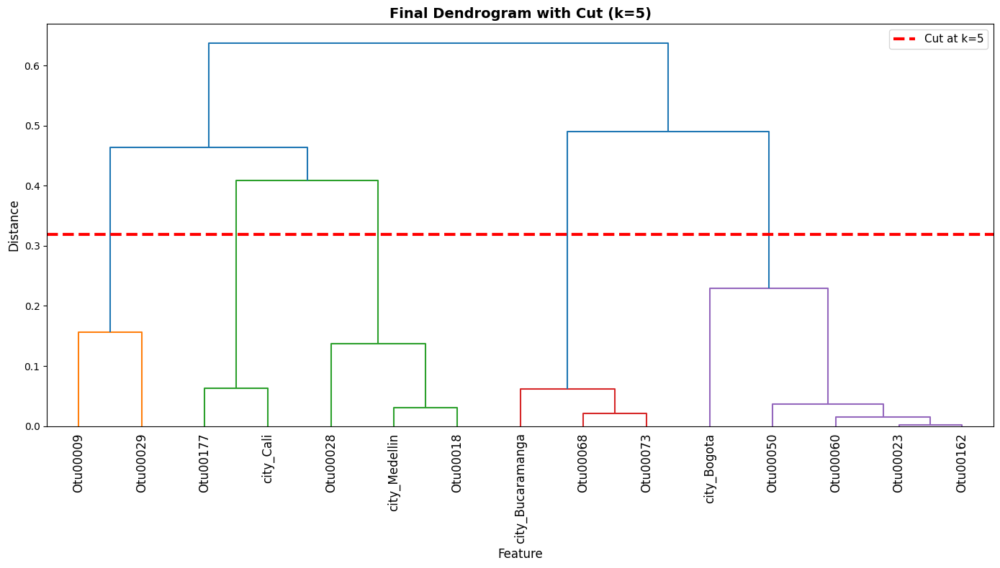


FEATURE GROUPS (k=5)

Group 1 (2 features):
  • Otu00009
  • Otu00029

Group 2 (2 features):
  • Otu00177
  • city_Cali

Group 3 (3 features):
  • city_Medellin
  • Otu00018
  • Otu00028

Group 4 (3 features):
  • city_Bucaramanga
  • Otu00068
  • Otu00073

Group 5 (5 features):
  • city_Bogota
  • Otu00023
  • Otu00060
  • Otu00162
  • Otu00050


In [ ]:
def dendogram_feature_groups(k):
    # Get clusters with optimal k
    cluster_labels = fcluster(linkage_matrix, k, criterion='maxclust')

    # Visualize final dendrogram with cut
    plt.figure(figsize=(14, 8))
    dendrogram(linkage_matrix, labels=top_feature_names, leaf_rotation=90)

    # Calculate cut height for k
    # Height where we get exactly k clusters
    cut_height = (linkage_matrix[-(k-1), 2] + linkage_matrix[-k, 2]) / 2

    plt.axhline(y=cut_height, color='red', linestyle='--', linewidth=3,
              label=f'Cut at k={k}')
    plt.title(f'Final Dendrogram with Cut (k={k})',
            fontsize=14, fontweight='bold')
    plt.xlabel('Feature', fontsize=12)
    plt.ylabel('Distance', fontsize=12)
    plt.legend(fontsize=11)
    plt.tight_layout()
    plt.show()

    # STEP 4: Print feature groups
    print("\n" + "="*70)
    print(f"FEATURE GROUPS (k={k})")
    print("="*70)

    feature_groups = {}

    for cluster_id in range(1, k + 1):
        cluster_features = [top_feature_names[i] for i in range(len(top_feature_names))
                          if cluster_labels[i] == cluster_id]
        print(f"\nGroup {cluster_id} ({len(cluster_features)} features):")
        feature_groups[cluster_id] = cluster_features
        for feature in cluster_features:
            print(f"  • {feature}")

    return cluster_labels, feature_groups

cluster_labels, feature_groups = dendogram_feature_groups(optimal_k)

In [ ]:
cluster_labels

array([4, 2, 5, 5, 3, 4, 4, 5, 5, 1, 3, 5, 2, 1, 3], dtype=int32)

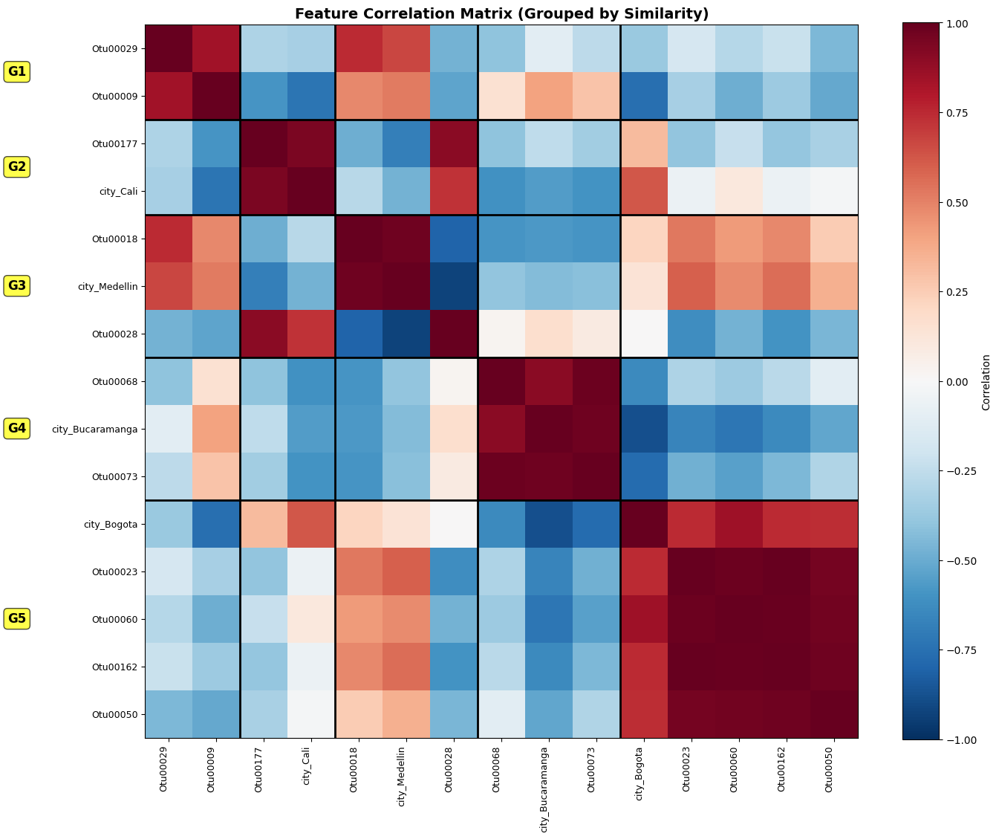

In [ ]:
n_clusters = optimal_k

# ============================================
# Visualize feature groups
# ============================================

# Sort by cluster
sorted_indices = np.argsort(cluster_labels)
sorted_similarity = pattern_similarity[sorted_indices][:, sorted_indices]
sorted_names = [top_feature_names[i] for i in sorted_indices]
sorted_clusters = cluster_labels[sorted_indices]

fig, ax = plt.subplots(figsize=(14, 12))

# Plot correlation matrix
im = ax.imshow(sorted_similarity, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(im, ax=ax, label='Correlation', shrink=0.9) # Added shrink=0.7 to make the color bar shorter

# Add cluster boundaries
cluster_changes = np.where(np.diff(sorted_clusters))[0] + 0.5
for change in cluster_changes:
    ax.axhline(change, color='black', linewidth=2)
    ax.axvline(change, color='black', linewidth=2)

# Add cluster labels on the side
for cluster_id in range(1, n_clusters + 1):
    cluster_mask = sorted_clusters == cluster_id
    cluster_start = np.where(cluster_mask)[0][0]
    cluster_end = np.where(cluster_mask)[0][-1]
    cluster_center = (cluster_start + cluster_end) / 2

    # Adjusted x-position for cluster labels to avoid overlap
    ax.text(-3, cluster_center, f'G{cluster_id}', # Changed -1.5 to -2.5 to move labels further left
           fontsize=12, fontweight='bold', ha='right', va='center',
           bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))

ax.set_xticks(range(n_top))
ax.set_xticklabels(sorted_names, rotation=90, ha='right', fontsize=9)
ax.set_yticks(range(n_top))
ax.set_yticklabels(sorted_names, fontsize=9)
ax.set_title('Feature Correlation Matrix (Grouped by Similarity)',
            fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

### Escenario 2

In [ ]:
# References: (Vettigli, 2025; Nanda, 2024)

SOM_X_AXIS_NODES  = 5
SOM_Y_AXIS_NODES  = 5
SOM_N_VARIABLES  = scaled_data.shape[1]
SOM_N_VARIABLES

106

In [ ]:
SIGMA0 = 1
ALPHA = 0.5
NEIGHBORHOOD_FUNC = 'gaussian'
DISTANCE_FUNC = 'cosine'
TOPOLOGY = 'rectangular'
SIGMA_DECAY_FUNC = 'inverse_decay_to_one'
DECAY_FUNC = 'asymptotic_decay'
RANDOM_SEED = 205 # 205

In [ ]:
som = MiniSom(
        SOM_X_AXIS_NODES,
        SOM_Y_AXIS_NODES,
        SOM_N_VARIABLES,
        sigma=SIGMA0,
        learning_rate=ALPHA,
        neighborhood_function=NEIGHBORHOOD_FUNC,
        activation_distance=DISTANCE_FUNC,
        topology=TOPOLOGY,
        sigma_decay_function = SIGMA_DECAY_FUNC,
        decay_function = DECAY_FUNC,
        random_seed=RANDOM_SEED,
        )

In [ ]:
som.random_weights_init(scaled_data)

In [ ]:
N_ITERATIONS = 283
som.train_random(scaled_data, N_ITERATIONS, verbose=True)

 [ 283 / 283 ] 100% - 0:00:00 left 
 quantization error: 31.842179721116775


In [ ]:
som.topographic_error(scaled_data)

np.float64(0.06802721088435375)

In [ ]:
winner_coordinates = [som.winner(x) for x in scaled_data]
hit_map = np.zeros((SOM_X_AXIS_NODES, SOM_Y_AXIS_NODES))
for x, y in winner_coordinates:
    hit_map[x, y] += 1

In [ ]:
empty_nodes = np.sum(hit_map == 0)
active_nodes = np.sum(hit_map > 0)

print(f"Empty nodes: {empty_nodes}")
print(f"Active nodes: {active_nodes}")
print(f"Percentage active: {100 * active_nodes / (SOM_X_AXIS_NODES * SOM_Y_AXIS_NODES):.1f}%")
print(f"Samples per active node (avg): {len(scaled_data) / active_nodes:.0f}")

Empty nodes: 0
Active nodes: 25
Percentage active: 100.0%
Samples per active node (avg): 18


In [ ]:
W = som.get_weights()

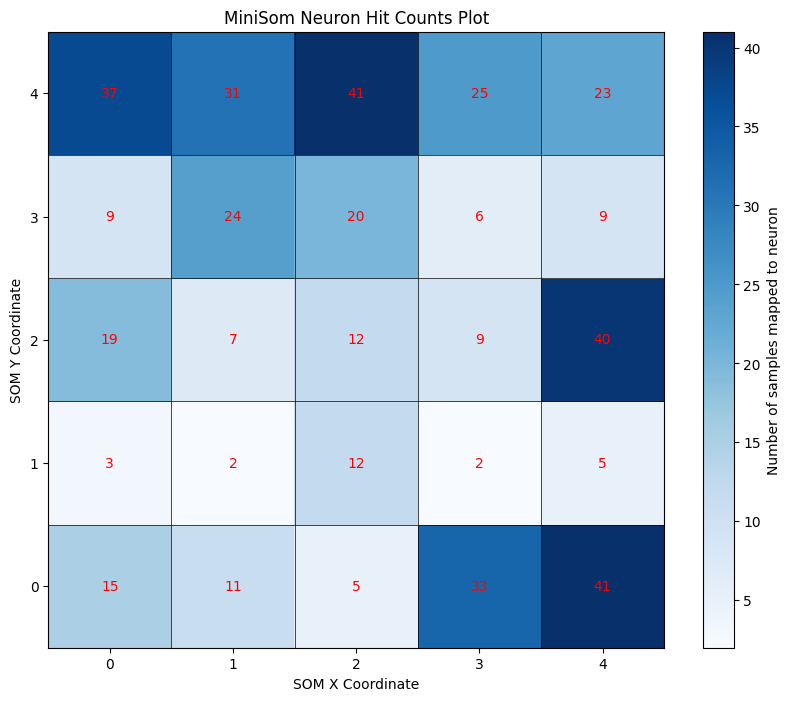

In [ ]:
# 4. Plot the results
plt.figure(figsize=(10, 8))

# Optional: Plot the distance map (U-matrix) as background
# plt.pcolor(som.distance_map().T, cmap='bone_r')
# plt.colorbar()

# Plot the hit counts on top of the map
plt.imshow(hit_map, cmap='Blues', interpolation='nearest', origin='lower')
plt.colorbar(label='Number of samples mapped to neuron')
plt.title('MiniSom Neuron Hit Counts Plot')
plt.xlabel('SOM X Coordinate')
plt.ylabel('SOM Y Coordinate')

# Set integer ticks centered on each cell
plt.xticks(np.arange(SOM_X_AXIS_NODES))
plt.yticks(np.arange(SOM_Y_AXIS_NODES))
# Ensure labels are integers
plt.gca().set_xticklabels(np.arange(SOM_X_AXIS_NODES))
plt.gca().set_yticklabels(np.arange(SOM_Y_AXIS_NODES))

# Add grid lines BETWEEN the neurons (at -0.5, 0.5, 1.5, ...)
plt.gca().set_xticks(np.arange(SOM_X_AXIS_NODES + 1) - 0.5, minor=True)
plt.gca().set_yticks(np.arange(SOM_Y_AXIS_NODES + 1) - 0.5, minor=True)
plt.grid(which='minor', color='black', linestyle='-', linewidth=0.5) # Draw grid using minor ticks
plt.tick_params(which='minor', length=0) # Hide the minor tick marks themselves

# Add text labels for counts
for i in range(SOM_Y_AXIS_NODES): # Iterate over y-axis (rows)
    for j in range(SOM_X_AXIS_NODES): # Iterate over x-axis (columns)
        plt.text(j, i, int(hit_map[i, j]), ha='center', va='center', color='red', fontsize=10)

plt.show()

In [ ]:
# Get cluster assignments from SOM
winners = np.array([som.winner(x) for x in scaled_data])
cluster_ids = winners[:, 0] * SOM_Y_AXIS_NODES + winners[:, 1]  # Flatten to 1D

# Calculate mutual information between each feature and clusters
mi_scores = []

for i, feature_name in enumerate(scaled_data_df.columns.values):
    feature_values = scaled_data[:, i]

    # Discretize continuous features for MI calculation
    if feature_name not in binary_cols:
        feature_discrete = np.digitize(feature_values,
                                      bins=np.percentile(feature_values, [0, 25, 50, 75, 100]))
    else:
        feature_discrete = feature_values

    mi = mutual_info_score(cluster_ids, feature_discrete)

    mi_scores.append({
        'feature': feature_name,
        'type': 'binary' if feature_name in binary_cols else 'continuous',
        'mutual_info': mi
    })

mi_df = pd.DataFrame(mi_scores).sort_values('mutual_info', ascending=False)

print("="*70)
print("MUTUAL INFORMATION: Feature vs SOM Clusters")
print("="*70)
print(mi_df.head(20))

# Check if binary features are completely ignored
binary_mi = mi_df[mi_df['type'] == 'binary']['mutual_info'].mean()
continuous_mi = mi_df[mi_df['type'] == 'continuous']['mutual_info'].mean()

print(f"\nAverage MI - Binary: {binary_mi:.4f}")
print(f"Average MI - Continuous: {continuous_mi:.4f}")
print(f"Ratio (Continuous/Binary): {continuous_mi/binary_mi:.2f}x")

if continuous_mi / binary_mi > 10:
    print("\n⚠️  WARNING: Continuous features dominate clustering (>10x more influence)")
    print("Consider scaling binary features if you want them to have more influence")
elif continuous_mi / binary_mi > 3:
    print("\n✓ Continuous features have moderate advantage (3-10x more influence)")
    print("This is typical and often acceptable")
else:
    print("\n✓ Binary and continuous features have similar influence")

MUTUAL INFORMATION: Feature vs SOM Clusters
     feature        type  mutual_info
64  Otu00073  continuous     0.288816
30  Otu00025  continuous     0.253340
25  Otu00020  continuous     0.245161
50  Otu00050  continuous     0.244920
27  Otu00022  continuous     0.225251
28  Otu00023  continuous     0.215920
76  Otu00092  continuous     0.207493
32  Otu00027  continuous     0.206713
89  Otu00121  continuous     0.200812
35  Otu00030  continuous     0.200441
54  Otu00058  continuous     0.197977
14  Otu00009  continuous     0.197161
65  Otu00074  continuous     0.196094
68  Otu00077  continuous     0.191345
55  Otu00059  continuous     0.188460
62  Otu00069  continuous     0.186262
37  Otu00033  continuous     0.185295
49  Otu00049  continuous     0.185221
40  Otu00037  continuous     0.184208
13  Otu00008  continuous     0.182595

Average MI - Binary: 0.0637
Average MI - Continuous: 0.1486
Ratio (Continuous/Binary): 2.33x

✓ Binary and continuous features have similar influence


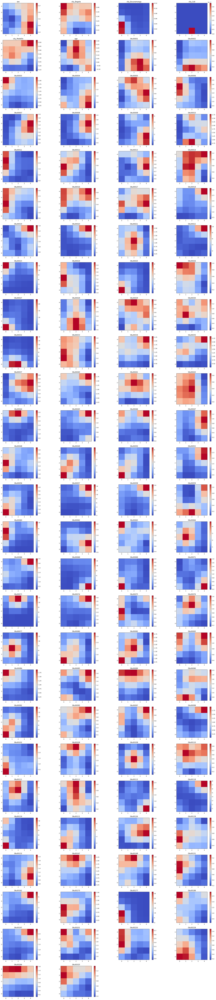

In [ ]:
plt.figure(figsize=(30, 150))
for i, f in enumerate(list(scaled_data_df.columns.values)):
    plt.subplot(30, 4, i+1)
    plt.title(f)
    plt.pcolor(W[:,:,i].T, cmap='coolwarm')

    # Center tick labels on squares, starting from 0
    plt.xticks(np.arange(SOM_X_AXIS_NODES) + 0.5, np.arange(SOM_X_AXIS_NODES))
    plt.yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5, np.arange(SOM_Y_AXIS_NODES))

    # Make each matrix visually square
    plt.gca().set_aspect('equal', adjustable='box')

    plt.colorbar()
plt.show()

In [ ]:
# Normalize each feature independently to [0, 1]
W_normalized = np.zeros_like(W)

for i in range(W.shape[2]):
    feature_weights = W[:, :, i]
    w_min = feature_weights.min()
    w_max = feature_weights.max()

    if w_max > w_min:  # Avoid division by zero
        W_normalized[:, :, i] = (feature_weights - w_min) / (w_max - w_min)
    else:
        W_normalized[:, :, i] = 0.5  # Uniform feature

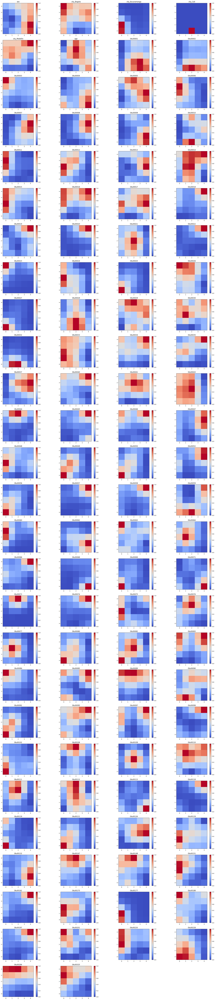

In [ ]:
plt.figure(figsize=(30, 150))
for i, f in enumerate(list(scaled_data_df.columns.values)):
    plt.subplot(30, 4, i+1)
    plt.title(f)
    plt.pcolor(W_normalized[:,:,i].T, cmap='coolwarm')

    # Center tick labels on squares, starting from 0
    plt.xticks(np.arange(SOM_X_AXIS_NODES) + 0.5, np.arange(SOM_X_AXIS_NODES))
    plt.yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5, np.arange(SOM_Y_AXIS_NODES))

    # Make each matrix visually square
    plt.gca().set_aspect('equal', adjustable='box')

    plt.colorbar()
plt.show()

In [ ]:
# Use it
plot_component_planes_comprehensive(W, W_normalized, feature_names)

In [ ]:
# Calculate comprehensive importance
importance_df = comprehensive_feature_importance(
    W, feature_names, binary_features
)

print("\n" + "="*80)
print("COMPREHENSIVE FEATURE IMPORTANCE ANALYSIS")
print("="*80)
print(importance_df[['feature', 'type', 'total_range', 'total_variance',
                       'composite_importance', 'rank']].head(20))

# Separate rankings
print("\n" + "="*80)
print("TOP BINARY FEATURES")
print("="*80)
binary_top = importance_df[importance_df['type'] == 'binary'].head(2)
print(binary_top[['feature', 'total_variance', 'composite_importance']])

print("\n" + "="*80)
print("TOP CONTINUOUS FEATURES")
print("="*80)
continuous_top = importance_df[importance_df['type'] == 'continuous'].head(15)
print(continuous_top[['feature', 'total_range', 'total_variance', 'composite_importance']])


COMPREHENSIVE FEATURE IMPORTANCE ANALYSIS
             feature        type  total_range  total_variance  \
0                sex      binary     0.467007        0.017021   
98          Otu00177  continuous    31.719396       68.817582   
4      city_Medellin      binary     0.394389        0.011715   
1        city_Bogota      binary     0.339783        0.007622   
32          Otu00027  continuous    23.003756       25.954286   
36          Otu00032  continuous    15.956791       19.524289   
76          Otu00092  continuous    14.342654       16.324412   
53          Otu00057  continuous    14.793402       12.113313   
68          Otu00077  continuous    13.108691       12.286548   
64          Otu00073  continuous    12.644682       10.861516   
28          Otu00023  continuous    13.298826        8.659332   
88          Otu00119  continuous    13.043608        8.941415   
61          Otu00068  continuous    12.509840        6.378373   
56          Otu00060  continuous    10.230862  

In [ ]:
top_to_analyze = 15

TOP 15 MOST IMPORTANT FEATURES
      feature  original_index       type  total_range  total_variance  norm_range  norm_variance  composite_importance  rank
          sex               0     binary     0.467007        0.017021    1.000000       1.000000              1.000000     1
     Otu00177              98 continuous    31.719396       68.817582    1.000000       1.000000              1.000000     2
city_Medellin               4     binary     0.394389        0.011715    0.844503       0.688264              0.766384     3
  city_Bogota               1     binary     0.339783        0.007622    0.727575       0.447818              0.587696     4
     Otu00027              32 continuous    23.003756       25.954286    0.721385       0.377012              0.549199     5
     Otu00032              36 continuous    15.956791       19.524289    0.496113       0.283557              0.389835     6
     Otu00092              76 continuous    14.342654       16.324412    0.444513       0.2370

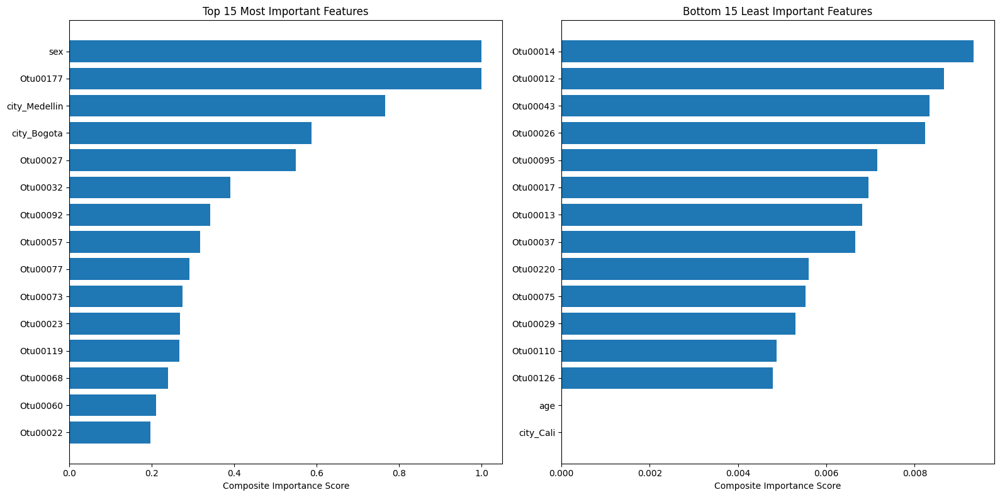

In [ ]:
# Show top important features
print("="*70)
print("TOP " + str(top_to_analyze) + " MOST IMPORTANT FEATURES")
print("="*70)
print(importance_df.head(top_to_analyze).to_string(index=False))

print("\n" + "="*70)
print("BOTTOM " + str(top_to_analyze) + " LEAST IMPORTANT FEATURES")
print("="*70)
print(importance_df.tail(top_to_analyze).to_string(index=False))

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].barh(range(top_to_analyze), importance_df['composite_importance'].head(top_to_analyze))
axes[0].set_yticks(range(top_to_analyze))
axes[0].set_yticklabels(importance_df['feature'].head(top_to_analyze))
axes[0].set_xlabel('Composite Importance Score')
axes[0].set_title('Top ' + str(top_to_analyze) + ' Most Important Features')
axes[0].invert_yaxis()

axes[1].barh(range(top_to_analyze), importance_df['composite_importance'].tail(top_to_analyze))
axes[1].set_yticks(range(top_to_analyze))
axes[1].set_yticklabels(importance_df['feature'].tail(top_to_analyze))
axes[1].set_xlabel('Composite Importance Score')
axes[1].set_title('Bottom ' + str(top_to_analyze) + ' Least Important Features')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()

In [ ]:
top_15_5x5_df = importance_df.sort_values('composite_importance', ascending=False).head(top_to_analyze)
top_15_5x5_df.reset_index(drop=True, inplace=True)
top_15_5x5_df

,feature,original_index,type,total_range,total_variance,norm_range,norm_variance,composite_importance,rank
0,sex,0,binary,0.467007,0.017021,1.000000,1.000000,1.000000,1
1,Otu00177,98,continuous,31.719396,68.817582,1.000000,1.000000,1.000000,2
2,city_Medellin,4,binary,0.394389,0.011715,0.844503,0.688264,0.766384,3
3,city_Bogota,1,binary,0.339783,0.007622,0.727575,0.447818,0.587696,4
4,Otu00027,32,continuous,23.003756,25.954286,0.721385,0.377012,0.549199,5
5,Otu00032,36,continuous,15.956791,19.524289,0.496113,0.283557,0.389835,6
6,Otu00092,76,continuous,14.342654,16.324412,0.444513,0.237049,0.340781,7
7,Otu00057,53,continuous,14.793402,12.113313,0.458922,0.175844,0.317383,8
8,Otu00077,68,continuous,13.108691,12.286548,0.405067,0.178361,0.291714,9
9,Otu00073,64,continuous,12.644682,10.861516,0.390234,0.157650,0.273942,10


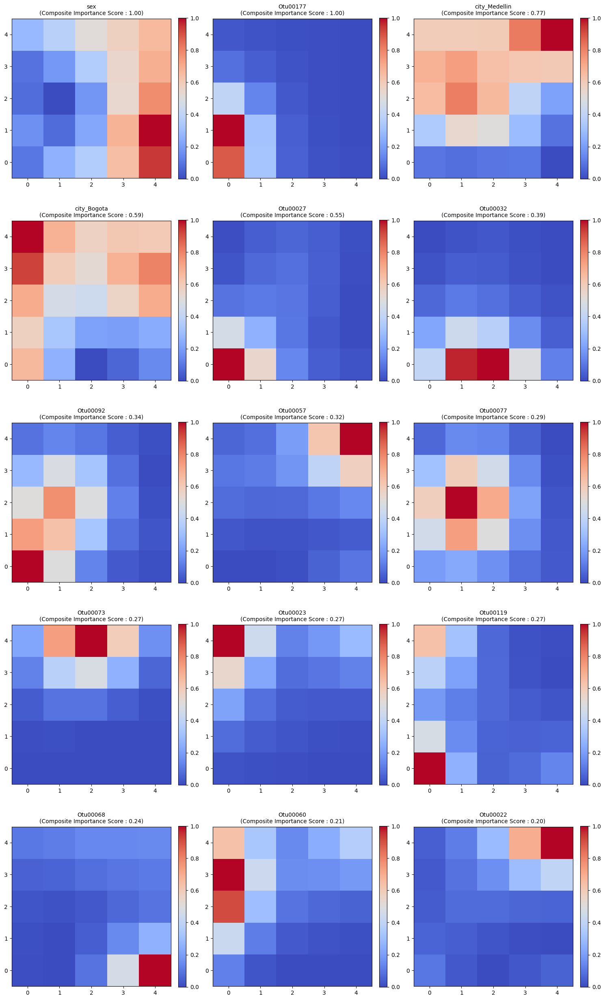

In [ ]:
top_features = importance_df.head(top_to_analyze)

# Plot only the most important features
top_feature_indices = top_features['original_index'].values
top_feature_names = top_features['feature'].values

n_features = len(top_feature_indices)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

plt.figure(figsize=(15, 5 * n_rows))

for i, (idx, name) in enumerate(zip(top_feature_indices, top_feature_names)):
    plt.subplot(n_rows, n_cols, i+1)
    plt.title(f'{name}\n(Composite Importance Score : {top_features.iloc[i]["composite_importance"]:.2f})', fontsize=10)
    plt.pcolor(W_normalized[:,:,idx].T, cmap='coolwarm')

    # Center tick labels on squares, starting from 0
    plt.xticks(np.arange(SOM_X_AXIS_NODES) + 0.5, np.arange(SOM_X_AXIS_NODES))
    plt.yticks(np.arange(SOM_Y_AXIS_NODES) + 0.5, np.arange(SOM_Y_AXIS_NODES))

    # Make each matrix visually square
    plt.gca().set_aspect('equal', adjustable='box')

    plt.colorbar(fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

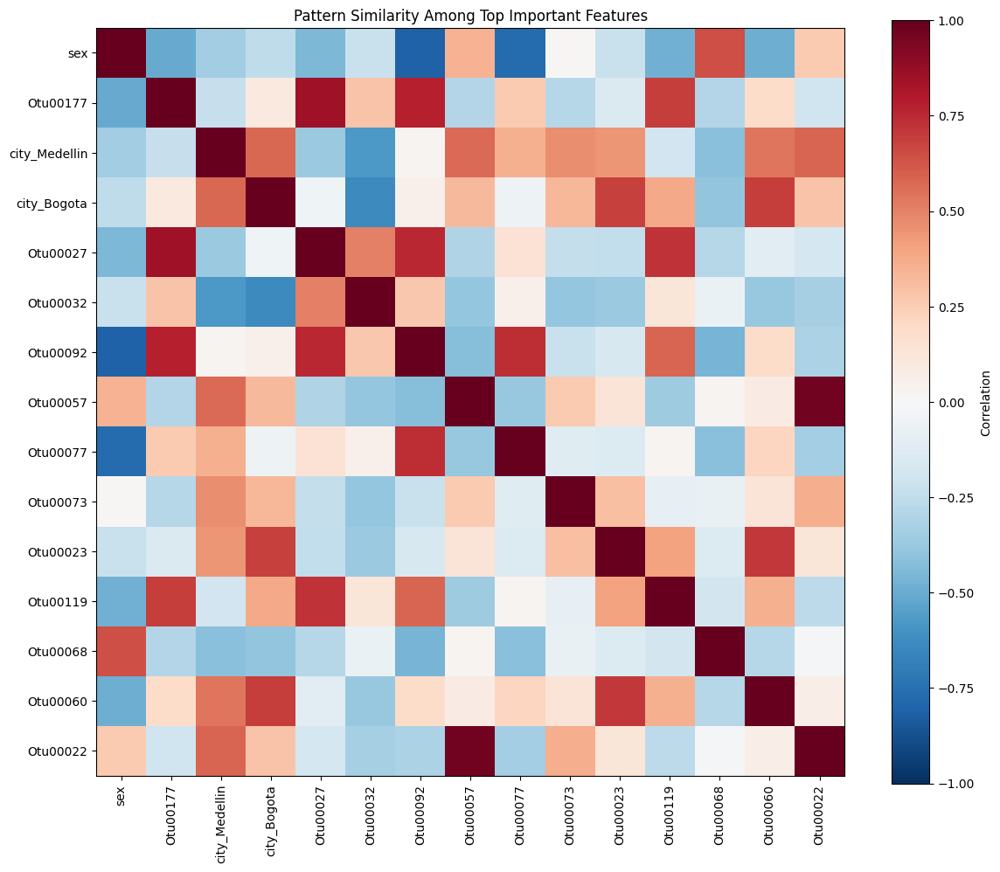

In [ ]:
# Group features by similar patterns
# Features with similar component planes are correlated

# Calculate correlation between component planes
n_top = len(top_feature_indices)
pattern_similarity = np.zeros((n_top, n_top))

for i in range(n_top):
    for j in range(n_top):
        idx_i = top_feature_indices[i]
        idx_j = top_feature_indices[j]

        weights_i = W[:,:,idx_i].flatten()
        weights_j = W[:,:,idx_j].flatten()

        # Correlation between the two component planes
        pattern_similarity[i, j] = np.corrcoef(weights_i, weights_j)[0, 1]

# Visualize pattern similarity
plt.figure(figsize=(12, 10))
plt.imshow(pattern_similarity, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(label='Correlation')
plt.xticks(range(n_top), top_feature_names, rotation=90)
plt.yticks(range(n_top), top_feature_names)
plt.title('Pattern Similarity Among Top Important Features')
plt.tight_layout()
plt.show()

#### Dendrograma

In [ ]:
distance_matrix, condensed_dist = distance_symmetric_matrix(pattern_similarity)

In [ ]:
# Test all linkage methods
methods = ['single', 'complete', 'average', 'weighted', 'centroid', 'median', 'ward'] # Reference: (SciPy, s.f.)
results = []

print("="*70)
print("COPHENETIC CORRELATION - Higher is Better (closer to 1)")
print("="*70)

for method in methods:
    try:
        linkage_matrix = linkage(condensed_dist, method=method)

        # Calculate cophenetic correlation
        coph_corr, coph_dist = cophenet(linkage_matrix, condensed_dist)

        results.append({
            'method': method,
            'cophenetic_correlation': coph_corr
        })

        print(f"{method.upper():12s}: {coph_corr:.4f}")

    except Exception as e:
        print(f"{method.upper():12s}: Failed ({str(e)})")

# Find best method
results_df = pd.DataFrame(results)
best_method = results_df.loc[results_df['cophenetic_correlation'].idxmax(), 'method']

print("="*70)
print(f"BEST METHOD: {best_method.upper()} (Cophenetic = {results_df['cophenetic_correlation'].max():.4f})")
print("="*70)

COPHENETIC CORRELATION - Higher is Better (closer to 1)
SINGLE      : 0.6742
COMPLETE    : 0.6953
AVERAGE     : 0.7620
WEIGHTED    : 0.7271
CENTROID    : 0.6811
MEDIAN      : 0.6694
WARD        : 0.7266
BEST METHOD: AVERAGE (Cophenetic = 0.7620)


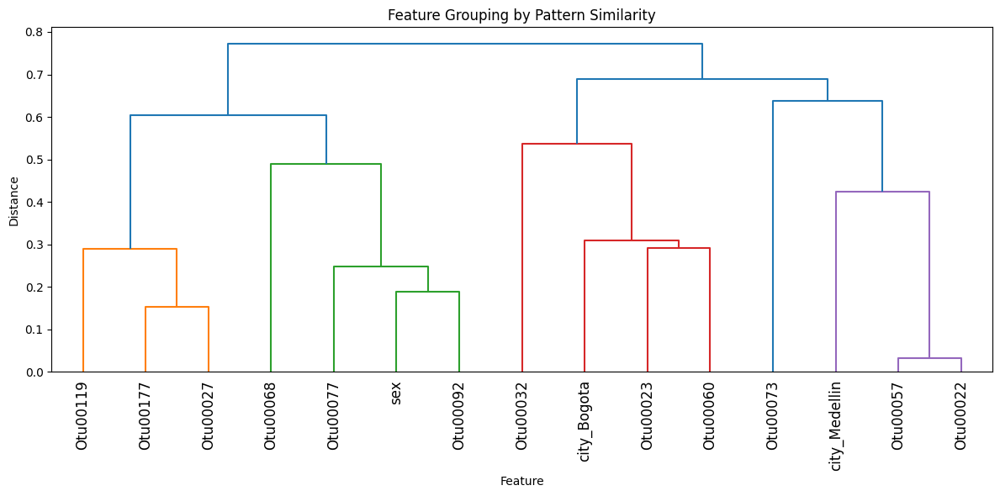

In [ ]:
# Hierarchical clustering
linkage_matrix = linkage(condensed_dist, method='average')

plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, labels=top_feature_names, leaf_rotation=90)
plt.title('Feature Grouping by Pattern Similarity')
plt.xlabel('Feature')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

TESTING DIFFERENT VALUES OF k
k= 2 | Sil=0.305 | DB=1.869 | CH=   3.3 | Balance=0.07 | Sizes=[7, 8]
k= 3 | Sil=0.326 | DB=2.093 | CH=   2.2 | Balance=0.28 | Sizes=[7, 4, 4]
k=4: Some clusters have too few samples. Skipping score calculation.
k= 4 | Sil=nan | DB=nan | CH=   nan | Balance=0.58 | Sizes=[7, 4, 3, 1]
k=5: Some clusters have too few samples. Skipping score calculation.
k= 5 | Sil=nan | DB=nan | CH=   nan | Balance=0.37 | Sizes=[3, 4, 4, 3, 1]
k=6: Some clusters have too few samples. Skipping score calculation.
k= 6 | Sil=nan | DB=nan | CH=   nan | Balance=0.45 | Sizes=[3, 4, 3, 1, 3, 1]
k=7: Some clusters have too few samples. Skipping score calculation.
k= 7 | Sil=nan | DB=nan | CH=   nan | Balance=0.46 | Sizes=[3, 3, 1, 3, 1, 3, 1]
k=8: Some clusters have too few samples. Skipping score calculation.
k= 8 | Sil=nan | DB=nan | CH=   nan | Balance=0.49 | Sizes=[3, 3, 1, 3, 1, 2, 1, 1]
k=9: Some clusters have too few samples. Skipping score calculation.
k= 9 | Sil=nan | DB=nan

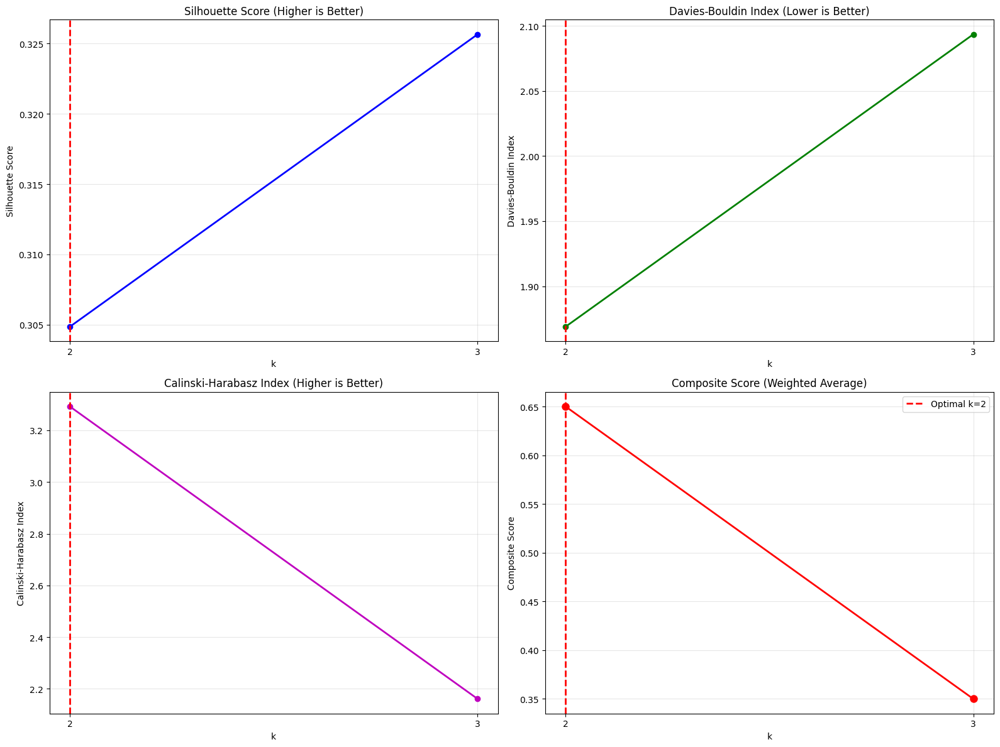

In [ ]:
# Run consensus analysis
optimal_k, results_df = find_optimal_k_consensus(
    distance_matrix, linkage_matrix, W, top_feature_indices, max_k=15
)

In [ ]:
results_df.sort_values('composite_score', ascending=False)

,k,silhouette,davies_bouldin,calinski_harabasz,balance_score,min_cluster_size,max_cluster_size,sil_norm,db_norm,ch_norm,balance_norm,composite_score
0,2,0.304851,1.868983,3.292041,0.066667,7,8,0.0,1.0,1.0,1.0,0.65
1,3,0.325664,2.093455,2.160895,0.282843,4,7,1.0,0.0,0.0,0.0,0.35


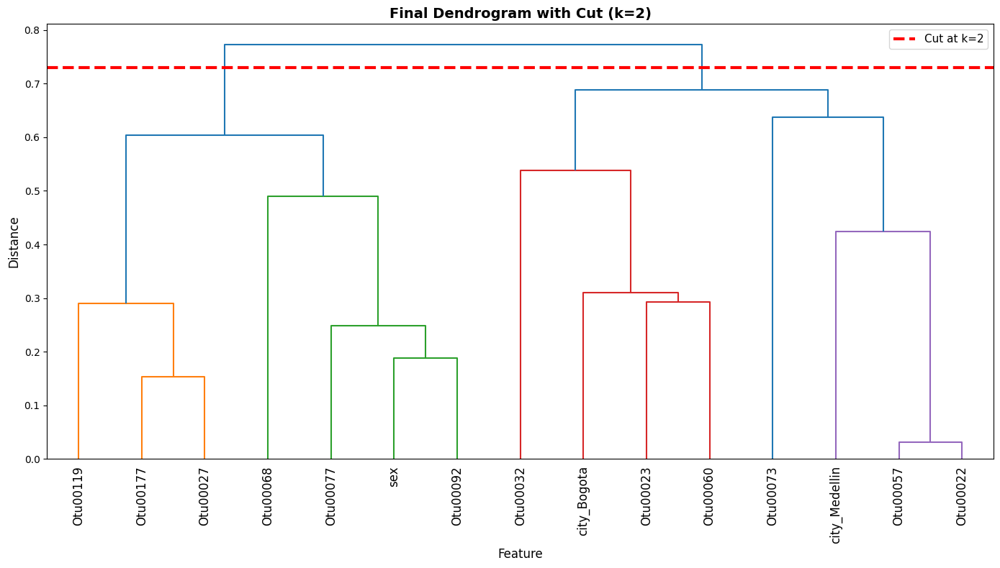


FEATURE GROUPS (k=2)

Group 1 (7 features):
  • sex
  • Otu00177
  • Otu00027
  • Otu00092
  • Otu00077
  • Otu00119
  • Otu00068

Group 2 (8 features):
  • city_Medellin
  • city_Bogota
  • Otu00032
  • Otu00057
  • Otu00073
  • Otu00023
  • Otu00060
  • Otu00022


In [ ]:
cluster_labels, feature_groups = dendogram_feature_groups(optimal_k)

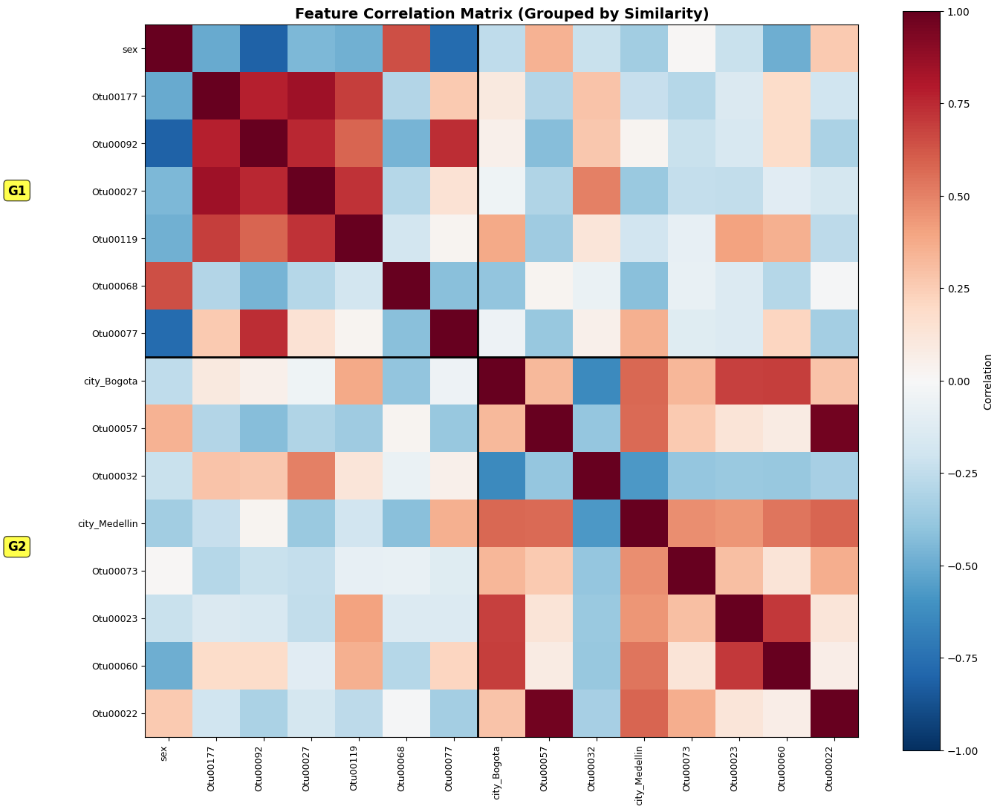

In [ ]:
n_clusters = optimal_k

# ============================================
# Visualize feature groups
# ============================================

# Sort by cluster
sorted_indices = np.argsort(cluster_labels)
sorted_similarity = pattern_similarity[sorted_indices][:, sorted_indices]
sorted_names = [top_feature_names[i] for i in sorted_indices]
sorted_clusters = cluster_labels[sorted_indices]

fig, ax = plt.subplots(figsize=(14, 12))

# Plot correlation matrix
im = ax.imshow(sorted_similarity, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(im, ax=ax, label='Correlation', shrink=0.9) # Added shrink=0.7 to make the color bar shorter

# Add cluster boundaries
cluster_changes = np.where(np.diff(sorted_clusters))[0] + 0.5
for change in cluster_changes:
    ax.axhline(change, color='black', linewidth=2)
    ax.axvline(change, color='black', linewidth=2)

# Add cluster labels on the side
for cluster_id in range(1, n_clusters + 1):
    cluster_mask = sorted_clusters == cluster_id
    cluster_start = np.where(cluster_mask)[0][0]
    cluster_end = np.where(cluster_mask)[0][-1]
    cluster_center = (cluster_start + cluster_end) / 2

    # Adjusted x-position for cluster labels to avoid overlap
    ax.text(-3, cluster_center, f'G{cluster_id}', # Changed -1.5 to -2.5 to move labels further left
           fontsize=12, fontweight='bold', ha='right', va='center',
           bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))

ax.set_xticks(range(n_top))
ax.set_xticklabels(sorted_names, rotation=90, ha='right', fontsize=9)
ax.set_yticks(range(n_top))
ax.set_yticklabels(sorted_names, fontsize=9)
ax.set_title('Feature Correlation Matrix (Grouped by Similarity)',
            fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

### Comparación de escenarios

In [ ]:
top_15_2x2_df

,feature,original_index,type,total_range,total_variance,norm_range,norm_variance,composite_importance,rank
0,city_Bucaramanga,2,binary,0.503318,0.036335,1.000000,1.000000,1.000000,1
1,Otu00177,98,continuous,18.132657,60.647700,1.000000,1.000000,1.000000,2
2,city_Bogota,1,binary,0.458858,0.031521,0.862904,0.846000,0.854452,3
3,Otu00023,28,continuous,7.424406,8.813186,0.405693,0.145289,0.275491,4
4,city_Medellin,4,binary,0.265647,0.012286,0.267108,0.230613,0.248861,5
5,Otu00068,61,continuous,6.655399,7.536021,0.363014,0.124229,0.243621,6
6,Otu00073,64,continuous,6.194799,6.975729,0.337450,0.114990,0.226220,7
7,Otu00060,56,continuous,6.050069,5.423327,0.329418,0.089393,0.209405,8
8,Otu00162,96,continuous,5.386178,4.792335,0.292572,0.078988,0.185780,9
9,Otu00009,14,continuous,5.381617,4.711117,0.292319,0.077649,0.184984,10


In [ ]:
merged_otus_df = pd.merge(top_15_2x2_df, df_otus_tax, left_on='feature', right_on='OTU', how='inner')
merged_otus_df.drop(columns=['OTU'], inplace=True) # Drop redundant 'OTU' column after merge
print("Mapped OTUs with their taxonomic information:")
merged_otus_df

Mapped OTUs with their taxonomic information:


,feature,original_index,type,total_range,total_variance,norm_range,norm_variance,composite_importance,rank,Taxonomy,Phylum,Class,Family,Total_Abundance
0,Otu00177,98,continuous,18.132657,60.647700,1.000000,1.000000,1.000000,2,k__Bacteria;p__Proteobacteria;c__Deltaproteoba...,Proteobacteria,Deltaproteobacteria,Desulfovibrionaceae,13433
1,Otu00023,28,continuous,7.424406,8.813186,0.405693,0.145289,0.275491,4,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Peptostreptococcaceae,62241
2,Otu00068,61,continuous,6.655399,7.536021,0.363014,0.124229,0.243621,6,k__Bacteria;p__Firmicutes;c__Bacilli;o__Lactob...,Firmicutes,Bacilli,Enterococcaceae,51701
3,Otu00073,64,continuous,6.194799,6.975729,0.337450,0.114990,0.226220,7,k__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Proteobacteria,Gammaproteobacteria,Pasteurellaceae,53679
4,Otu00060,56,continuous,6.050069,5.423327,0.329418,0.089393,0.209405,8,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Clostridiaceae,28161
5,Otu00162,96,continuous,5.386178,4.792335,0.292572,0.078988,0.185780,9,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Ruminococcaceae,12627
6,Otu00009,14,continuous,5.381617,4.711117,0.292319,0.077649,0.184984,10,k__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Proteobacteria,Gammaproteobacteria,Enterobacteriaceae,404155
7,Otu00018,23,continuous,4.253193,3.078135,0.229691,0.050722,0.140207,11,k__Bacteria;p__Actinobacteria;c__Coriobacterii...,Actinobacteria,Coriobacteriia,Coriobacteriaceae,211425
8,Otu00050,50,continuous,4.217634,3.032077,0.227718,0.049963,0.138840,12,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Bacteroidaceae,44524
9,Otu00029,34,continuous,4.063724,2.894484,0.219176,0.047694,0.133435,14,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Clostridiaceae,119943


In [ ]:
top_15_5x5_df

,feature,original_index,type,total_range,total_variance,norm_range,norm_variance,composite_importance,rank
0,sex,0,binary,0.467007,0.017021,1.000000,1.000000,1.000000,1
1,Otu00177,98,continuous,31.719396,68.817582,1.000000,1.000000,1.000000,2
2,city_Medellin,4,binary,0.394389,0.011715,0.844503,0.688264,0.766384,3
3,city_Bogota,1,binary,0.339783,0.007622,0.727575,0.447818,0.587696,4
4,Otu00027,32,continuous,23.003756,25.954286,0.721385,0.377012,0.549199,5
5,Otu00032,36,continuous,15.956791,19.524289,0.496113,0.283557,0.389835,6
6,Otu00092,76,continuous,14.342654,16.324412,0.444513,0.237049,0.340781,7
7,Otu00057,53,continuous,14.793402,12.113313,0.458922,0.175844,0.317383,8
8,Otu00077,68,continuous,13.108691,12.286548,0.405067,0.178361,0.291714,9
9,Otu00073,64,continuous,12.644682,10.861516,0.390234,0.157650,0.273942,10


In [ ]:
merged_otus_df = pd.merge(top_15_5x5_df, df_otus_tax, left_on='feature', right_on='OTU', how='inner')
merged_otus_df.drop(columns=['OTU'], inplace=True) # Drop redundant 'OTU' column after merge
print("Mapped OTUs with their taxonomic information:")
merged_otus_df

Mapped OTUs with their taxonomic information:


,feature,original_index,type,total_range,total_variance,norm_range,norm_variance,composite_importance,rank,Taxonomy,Phylum,Class,Family,Total_Abundance
0,Otu00177,98,continuous,31.719396,68.817582,1.000000,1.000000,1.000000,2,k__Bacteria;p__Proteobacteria;c__Deltaproteoba...,Proteobacteria,Deltaproteobacteria,Desulfovibrionaceae,13433
1,Otu00027,32,continuous,23.003756,25.954286,0.721385,0.377012,0.549199,5,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Bacteroidaceae,93006
2,Otu00032,36,continuous,15.956791,19.524289,0.496113,0.283557,0.389835,6,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Prevotellaceae,61949
3,Otu00092,76,continuous,14.342654,16.324412,0.444513,0.237049,0.340781,7,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Bacteroidaceae,15768
4,Otu00057,53,continuous,14.793402,12.113313,0.458922,0.175844,0.317383,8,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Lachnospiraceae,18498
5,Otu00077,68,continuous,13.108691,12.286548,0.405067,0.178361,0.291714,9,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Bacteroidaceae,39779
6,Otu00073,64,continuous,12.644682,10.861516,0.390234,0.157650,0.273942,10,k__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Proteobacteria,Gammaproteobacteria,Pasteurellaceae,53679
7,Otu00023,28,continuous,13.298826,8.659332,0.411145,0.125642,0.268394,11,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Peptostreptococcaceae,62241
8,Otu00119,88,continuous,13.043608,8.941415,0.402986,0.129742,0.266364,12,k__Bacteria;p__Proteobacteria;c__Deltaproteoba...,Proteobacteria,Deltaproteobacteria,Desulfovibrionaceae,34208
9,Otu00068,61,continuous,12.509840,6.378373,0.385923,0.092490,0.239207,13,k__Bacteria;p__Firmicutes;c__Bacilli;o__Lactob...,Firmicutes,Bacilli,Enterococcaceae,51701


In [ ]:
df_shared_top_features = pd.merge(top_15_2x2_df, top_15_5x5_df, on='feature', how='inner')
df_shared_top_features = df_shared_top_features.loc[:, ~df_shared_top_features.columns.duplicated()]
# Keep relevant columns and rename them for clarity
df_shared_top_features = df_shared_top_features[[
    'feature',
    'original_index_x',
    'type_x',
    'total_range_x',
    'total_variance_x',
    'composite_importance_x',
    'rank_x'
]].copy()
df_shared_top_features.columns = [
    'feature',
    'original_index',
    'type',
    'total_range_2x2',
    'total_variance_2x2',
    'composite_importance_2x2',
    'rank_2x2'
]

# Add columns from top_15_5x5_df as new columns
df_shared_top_features = pd.merge(df_shared_top_features, top_15_5x5_df[['feature', 'total_range', 'total_variance', 'composite_importance', 'rank']], on='feature', how='left')
df_shared_top_features.rename(columns={
    'total_range': 'total_range_5x5',
    'total_variance': 'total_variance_5x5',
    'composite_importance': 'composite_importance_5x5',
    'rank': 'rank_5x5'
}, inplace=True)

df_shared_top_features

,feature,original_index,type,total_range_2x2,total_variance_2x2,composite_importance_2x2,rank_2x2,total_range_5x5,total_variance_5x5,composite_importance_5x5,rank_5x5
0,Otu00177,98,continuous,18.132657,60.647700,1.000000,2,31.719396,68.817582,1.000000,2
1,city_Bogota,1,binary,0.458858,0.031521,0.854452,3,0.339783,0.007622,0.587696,4
2,Otu00023,28,continuous,7.424406,8.813186,0.275491,4,13.298826,8.659332,0.268394,11
3,city_Medellin,4,binary,0.265647,0.012286,0.248861,5,0.394389,0.011715,0.766384,3
4,Otu00068,61,continuous,6.655399,7.536021,0.243621,6,12.509840,6.378373,0.239207,13
5,Otu00073,64,continuous,6.194799,6.975729,0.226220,7,12.644682,10.861516,0.273942,10
6,Otu00060,56,continuous,6.050069,5.423327,0.209405,8,10.230862,7.495252,0.210897,14


In [ ]:
df_shared_top_features[["feature", "rank_2x2", "rank_5x5"]]

,feature,rank_2x2,rank_5x5
0,Otu00177,2,2
1,city_Bogota,3,4
2,Otu00023,4,11
3,city_Medellin,5,3
4,Otu00068,6,13
5,Otu00073,7,10
6,Otu00060,8,14


In [ ]:
merged_otus_df = pd.merge(df_shared_top_features, df_otus_tax, left_on='feature', right_on='OTU', how='inner')
merged_otus_df.drop(columns=['OTU'], inplace=True) # Drop redundant 'OTU' column after merge
print("Mapped OTUs with their taxonomic information:")
merged_otus_df

Mapped OTUs with their taxonomic information:


,feature,original_index,type,total_range_2x2,total_variance_2x2,composite_importance_2x2,rank_2x2,total_range_5x5,total_variance_5x5,composite_importance_5x5,rank_5x5,Taxonomy,Phylum,Class,Family,Total_Abundance
0,Otu00177,98,continuous,18.132657,60.647700,1.000000,2,31.719396,68.817582,1.000000,2,k__Bacteria;p__Proteobacteria;c__Deltaproteoba...,Proteobacteria,Deltaproteobacteria,Desulfovibrionaceae,13433
1,Otu00023,28,continuous,7.424406,8.813186,0.275491,4,13.298826,8.659332,0.268394,11,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Peptostreptococcaceae,62241
2,Otu00068,61,continuous,6.655399,7.536021,0.243621,6,12.509840,6.378373,0.239207,13,k__Bacteria;p__Firmicutes;c__Bacilli;o__Lactob...,Firmicutes,Bacilli,Enterococcaceae,51701
3,Otu00073,64,continuous,6.194799,6.975729,0.226220,7,12.644682,10.861516,0.273942,10,k__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Proteobacteria,Gammaproteobacteria,Pasteurellaceae,53679
4,Otu00060,56,continuous,6.050069,5.423327,0.209405,8,10.230862,7.495252,0.210897,14,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Clostridiaceae,28161


## *SAE*

In [ ]:
# tf.random.set_seed(490)

In [ ]:
# References (GeeksforGeeks, 2025a; GeeksforGeeks, 2025b)

class SparseAutoencoder(keras.Model):
    def __init__(self, input_dim, encoding_dim, sparsity_weight=1e-4):
        """
        Initialize the sparse autoencoder.

        Args:
            input_dim: Dimension of input data
            encoding_dim: Dimension of encoded representation (bottleneck)
            sparsity_weight: Weight for L1 sparsity penalty (controls how sparse)
        """
        super(SparseAutoencoder, self).__init__()
        self.input_dim = input_dim
        self.encoding_dim = encoding_dim
        self.sparsity_weight = sparsity_weight

        print(f"Autoencoder generated: {input_dim} -> {encoding_dim} -> {input_dim}")

        self.encoder = keras.Sequential([
            layers.Dense(64, activation='relu', input_shape=(input_dim,)),
            layers.Dense(encoding_dim, activation='relu', activity_regularizer=keras.regularizers.l1(sparsity_weight))
        ])

        print(f"Encoder built: {input_dim} -> 64 -> {encoding_dim}")

        self.decoder = keras.Sequential([
            layers.Dense(64, activation='relu', input_shape=(encoding_dim,)),
            layers.Dense(input_dim, activation='sigmoid')
        ])

        print(f"Decoder built: {encoding_dim} -> 64 -> {input_dim}")

    def call(self, x):
        """
        Forward pass through the autoencoder.

        Args:
            x: Input data

        Returns:
            Reconstructed output
        """
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [ ]:
autoencoder = SparseAutoencoder(input_dim=scaled_data_df.shape[1], encoding_dim=20)

autoencoder.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='mse',
    metrics=['mae', keras.metrics.CosineSimilarity()]
)

Autoencoder generated: 106 -> 20 -> 106
Encoder built: 106 -> 64 -> 20
Decoder built: 20 -> 64 -> 106


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
x_train, x_test = train_test_split(scaled_data, test_size=0.2, random_state=490)

print(f"Training samples: {x_train.shape[0]}")
print(f"Test samples: {x_test.shape[0]}")

# Training
history = autoencoder.fit(
    x_train, x_train,      # Input and target are the same (reconstruction)
    epochs=20,              # Number of times to see the full dataset 10-25
    batch_size=32,
    shuffle=True,           # Shuffle data each epoch
    validation_split=0.2,
    callbacks=[
        keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=5,
            restore_best_weights=True
        )
    ]
)

print("\n✅ Training complete!")

Training samples: 352
Test samples: 89
Epoch 1/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - cosine_similarity: 0.3439 - loss: 0.2225 - mae: 0.4623 - val_cosine_similarity: 0.3459 - val_loss: 0.2173 - val_mae: 0.4584
Epoch 2/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - cosine_similarity: 0.3446 - loss: 0.2164 - mae: 0.4575 - val_cosine_similarity: 0.3474 - val_loss: 0.2110 - val_mae: 0.4517
Epoch 3/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - cosine_similarity: 0.3465 - loss: 0.2094 - mae: 0.4496 - val_cosine_similarity: 0.3518 - val_loss: 0.1978 - val_mae: 0.4355
Epoch 4/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - cosine_similarity: 0.3516 - loss: 0.1937 - mae: 0.4300 - val_cosine_similarity: 0.3630 - val_loss: 0.1680 - val_mae: 0.3960
Epoch 5/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - cosine_similarity: 0.3650 - loss: 0.1592 - mae: 0.3827 - val_cosine_similarity: 0.3915 - val_loss: 0.1156 - val_mae: 0.3127
Epoch 6/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - cosine_similarity: 0.3993 - loss: 0.1039

In [ ]:
# Get encoded representations for test set
encoded_test = autoencoder.encoder.predict(x_test)

# Calculate sparsity
sparsity_threshold = 0.1  # Values below this are considered "inactive"
near_zero = np.abs(encoded_test) < sparsity_threshold
sparsity_percentage = np.mean(near_zero) * 100

print(f"\n{'='*50}")
print(f"SPARSITY ANALYSIS")
print(f"{'='*50}")
print(f"Sparsity percentage (< {sparsity_threshold}): {sparsity_percentage:.2f}%")
print(f"Average absolute activation: {np.mean(np.abs(encoded_test)):.4f}")
print(f"Max activation: {np.max(encoded_test):.4f}")
print(f"Min activation: {np.min(encoded_test):.4f}")
print(f"Std of activations: {np.std(encoded_test):.4f}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

SPARSITY ANALYSIS
Sparsity percentage (< 0.1): 75.73%
Average absolute activation: 0.1519
Max activation: 2.6771
Min activation: 0.0000
Std of activations: 0.3296


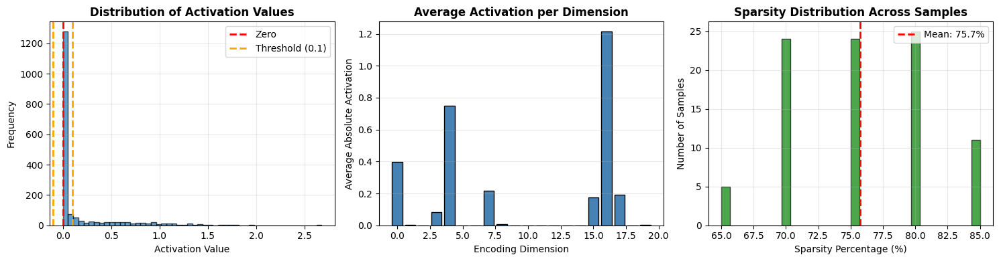

In [ ]:
# Generate sparsity visualizations
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Plot 1: Histogram of all activation values
axes[0].hist(encoded_test.flatten(), bins=50, edgecolor='black', alpha=0.7)
axes[0].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
axes[0].axvline(x=sparsity_threshold, color='orange', linestyle='--', linewidth=2, label=f'Threshold ({sparsity_threshold})')
axes[0].axvline(x=-sparsity_threshold, color='orange', linestyle='--', linewidth=2)
axes[0].set_title('Distribution of Activation Values', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Activation Value')
axes[0].set_ylabel('Frequency')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Average activation per encoding dimension
avg_activation = np.mean(np.abs(encoded_test), axis=0)
axes[1].bar(range(len(avg_activation)), avg_activation, color='steelblue', edgecolor='black')
axes[1].set_title('Average Activation per Dimension', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Encoding Dimension')
axes[1].set_ylabel('Average Absolute Activation')
axes[1].grid(True, alpha=0.3, axis='y')

# Plot 3: Sparsity per sample
sparsity_per_sample = np.mean(near_zero, axis=1) * 100
axes[2].hist(sparsity_per_sample, bins=30, edgecolor='black', color='green', alpha=0.7)
axes[2].axvline(x=sparsity_percentage, color='red', linestyle='--', linewidth=2, label=f'Mean: {sparsity_percentage:.1f}%')
axes[2].set_title('Sparsity Distribution Across Samples', fontsize=12, fontweight='bold')
axes[2].set_xlabel('Sparsity Percentage (%)')
axes[2].set_ylabel('Number of Samples')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


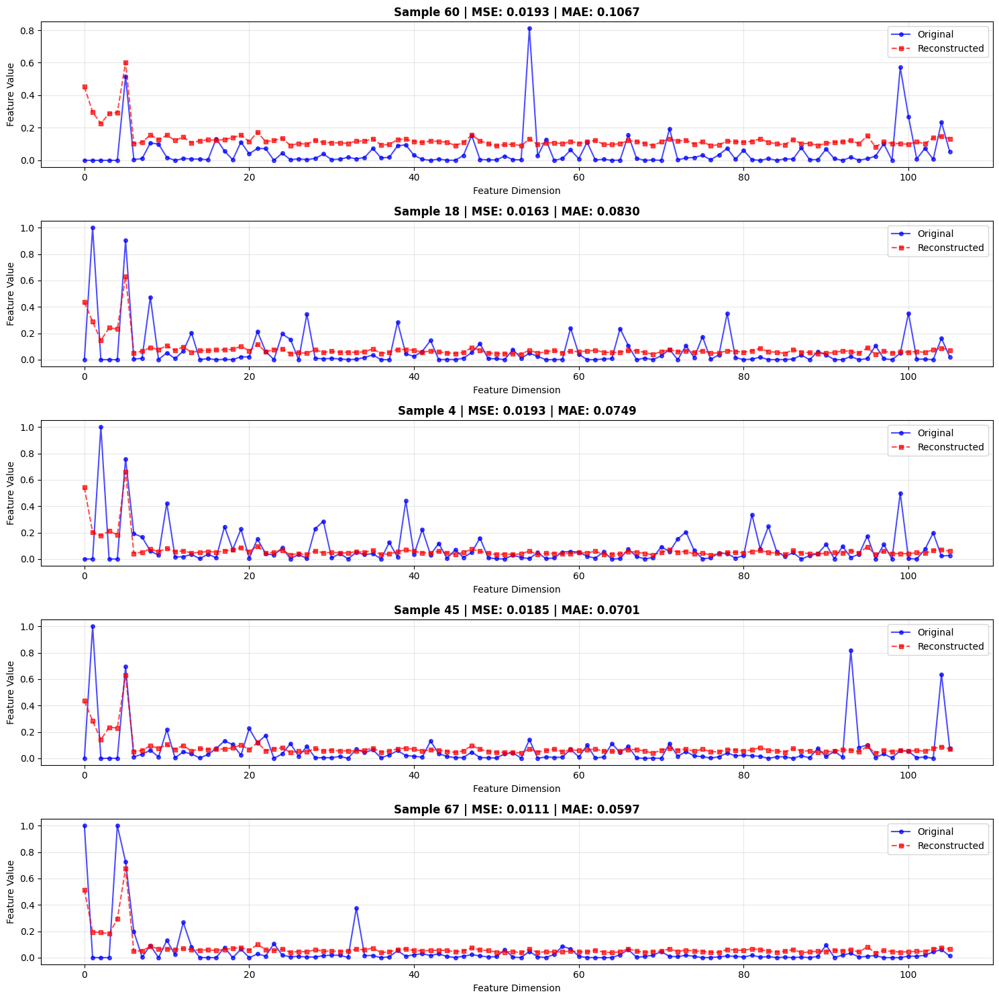

In [ ]:
# Get reconstructions
reconstructed_test = autoencoder.predict(x_test)

# Visualize reconstruction quality for a few samples
n_samples = 5
sample_indices = np.random.choice(len(x_test), n_samples, replace=False)

fig, axes = plt.subplots(n_samples, 1, figsize=(15, 3*n_samples))

for i, idx in enumerate(sample_indices):
    ax = axes[i] if n_samples > 1 else axes

    # Plot original vs reconstructed
    x_axis = np.arange(106)
    ax.plot(x_axis, x_test[idx], 'b-o', label='Original', markersize=4, alpha=0.7)
    ax.plot(x_axis, reconstructed_test[idx], 'r--s', label='Reconstructed', markersize=4, alpha=0.7)

    # Calculate reconstruction error
    mse_sample = np.mean((x_test[idx] - reconstructed_test[idx])**2)
    mae_sample = np.mean(np.abs(x_test[idx] - reconstructed_test[idx]))

    ax.set_title(f'Sample {idx} | MSE: {mse_sample:.4f} | MAE: {mae_sample:.4f}',
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('Feature Dimension')
    ax.set_ylabel('Feature Value')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

RECONSTRUCTION QUALITY
Test MSE:  0.018268
Test MAE:  0.079546
Test RMSE: 0.135161

Worst reconstructed features (indices): [1 2 3 4 0]
Best reconstructed features (indices): [96 69 85 94 64]


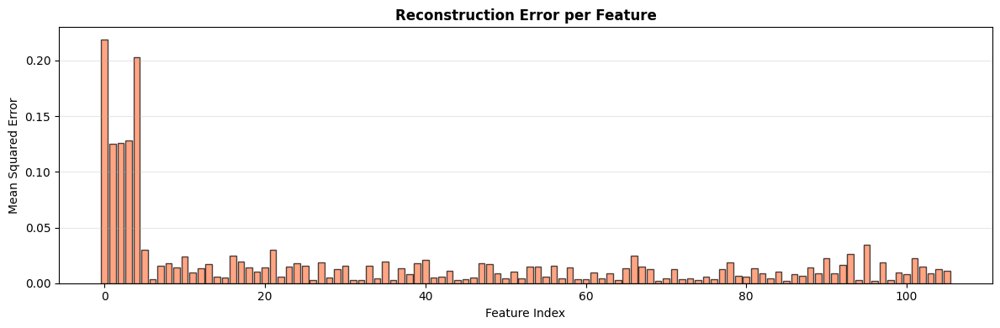

In [ ]:
# Calculate overall reconstruction metrics
reconstructed_test = autoencoder.predict(x_test)

mse_test = np.mean((x_test - reconstructed_test)**2)
mae_test = np.mean(np.abs(x_test - reconstructed_test))
rmse_test = np.sqrt(mse_test)

# Feature-wise errors
feature_errors = np.mean((x_test - reconstructed_test)**2, axis=0)
worst_features = np.argsort(feature_errors)[-5:]  # 5 worst reconstructed features
best_features = np.argsort(feature_errors)[:5]     # 5 best reconstructed features

print(f"\n{'='*50}")
print(f"RECONSTRUCTION QUALITY")
print(f"{'='*50}")
print(f"Test MSE:  {mse_test:.6f}")
print(f"Test MAE:  {mae_test:.6f}")
print(f"Test RMSE: {rmse_test:.6f}")
print(f"\nWorst reconstructed features (indices): {worst_features}")
print(f"Best reconstructed features (indices): {best_features}")

# Visualize feature-wise errors
plt.figure(figsize=(12, 4))
plt.bar(range(106), feature_errors, color='coral', edgecolor='black', alpha=0.7)
plt.title('Reconstruction Error per Feature', fontsize=12, fontweight='bold')
plt.xlabel('Feature Index')
plt.ylabel('Mean Squared Error')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

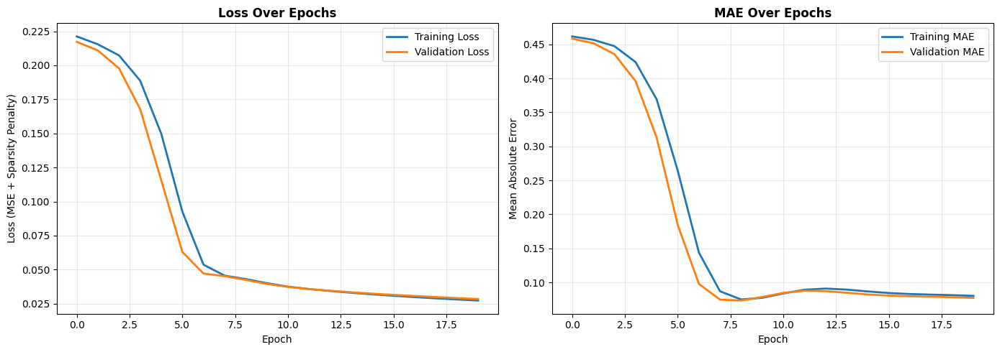

In [ ]:
# Plot training curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss
axes[0].plot(history.history['loss'], label='Training Loss', linewidth=2)
axes[0].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
axes[0].set_title('Loss Over Epochs', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss (MSE + Sparsity Penalty)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# MAE
axes[1].plot(history.history['mae'], label='Training MAE', linewidth=2)
axes[1].plot(history.history['val_mae'], label='Validation MAE', linewidth=2)
axes[1].set_title('MAE Over Epochs', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Mean Absolute Error')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
print(f"\n{'='*60}")
print(f"EXPERIMENT SUMMARY")
print(f"{'='*60}")
print(f"Configuration:")
print(f"  - Input dimensions: {autoencoder.input_dim}")
print(f"  - Encoding dimensions: {autoencoder.encoding_dim}")
print(f"  - Compression ratio: {autoencoder.input_dim / autoencoder.encoding_dim:.2f}x")
print(f"  - Sparsity weight: {autoencoder.sparsity_weight}")
print(f"  - Batch size: 32")
print(f"  - Epochs trained: {len(history.history['loss'])}")
print(f"\nResults:")
print(f"  - Final training loss: {history.history['loss'][-1]:.6f}")
print(f"  - Final validation loss: {history.history['val_loss'][-1]:.6f}")
print(f"  - Test MSE: {mse_test:.6f}")
print(f"  - Test MAE: {mae_test:.6f}")
print(f"  - Sparsity: {sparsity_percentage:.2f}%")
print(f"{'='*60}")


EXPERIMENT SUMMARY
Configuration:
  - Input dimensions: 106
  - Encoding dimensions: 20
  - Compression ratio: 5.30x
  - Sparsity weight: 0.0001
  - Batch size: 32
  - Epochs trained: 20

Results:
  - Final training loss: 0.027341
  - Final validation loss: 0.028449
  - Test MSE: 0.018268
  - Test MAE: 0.079546
  - Sparsity: 75.73%


In [ ]:
scaled_data.shape

(441, 106)

In [ ]:
encoded = autoencoder.encoder.predict(scaled_data)

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


In [ ]:
encoded.shape

(441, 20)

In [ ]:
encoded_df = pd.DataFrame(encoded)
encoded_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.409740,0.0,0.0,0.139977,0.908465,0.0,0.0,0.494725,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.049599,1.222875,0.033024,0.0,0.0
1,0.116453,0.0,0.0,0.095840,0.621548,0.0,0.0,0.564522,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.254561,0.928824,0.023244,0.0,0.0
2,0.495318,0.0,0.0,0.075251,0.865111,0.0,0.0,0.476673,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050991,1.226301,0.159245,0.0,0.0
3,0.609735,0.0,0.0,0.208091,0.844132,0.0,0.0,0.440961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.112368,0.947483,0.056484,0.0,0.0
4,0.136030,0.0,0.0,0.196430,0.532799,0.0,0.0,0.719619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.702049,0.881475,0.015256,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436,0.628465,0.0,0.0,0.093275,0.938356,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.096755,1.770749,0.303816,0.0,0.0
437,0.609893,0.0,0.0,0.052413,1.014944,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.093731,1.693837,0.467786,0.0,0.0
438,0.433370,0.0,0.0,0.080556,0.626807,0.0,0.0,0.040391,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061923,1.726065,0.376823,0.0,0.0
439,0.551507,0.0,0.0,0.142423,0.857743,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.076117,1.580317,0.411540,0.0,0.0


In [ ]:
encoded_df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
count,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.000000,441.0,441.0,441.0,441.0,441.0,441.000000,441.000000,441.000000,441.000000,441.000000
mean,0.404253,0.000221,0.000086,0.066386,0.746922,0.000173,0.000229,0.165421,0.004621,0.000002,0.0,0.0,0.0,0.0,0.0,0.169456,1.245232,0.218991,0.000011,0.001354
std,0.264553,0.004129,0.001803,0.066392,0.184244,0.002611,0.003604,0.230637,0.017113,0.000038,0.0,0.0,0.0,0.0,0.0,0.172423,0.299907,0.173523,0.000238,0.009670
min,0.000000,0.000000,0.000000,0.000000,0.342972,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.641829,0.000000,0.000000,0.000000
25%,0.191114,0.000000,0.000000,0.000000,0.595156,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.027437,1.027116,0.062511,0.000000,0.000000
50%,0.387726,0.000000,0.000000,0.059957,0.759341,0.000000,0.000000,0.053166,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.110435,1.220503,0.178719,0.000000,0.000000
75%,0.586397,0.000000,0.000000,0.112295,0.875105,0.000000,0.000000,0.262442,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.272016,1.417712,0.375585,0.000000,0.000000
max,1.217287,0.085950,0.037854,0.313076,1.413736,0.046462,0.072900,1.021985,0.134669,0.000800,0.0,0.0,0.0,0.0,0.0,0.975154,2.677065,0.857404,0.005005,0.125027


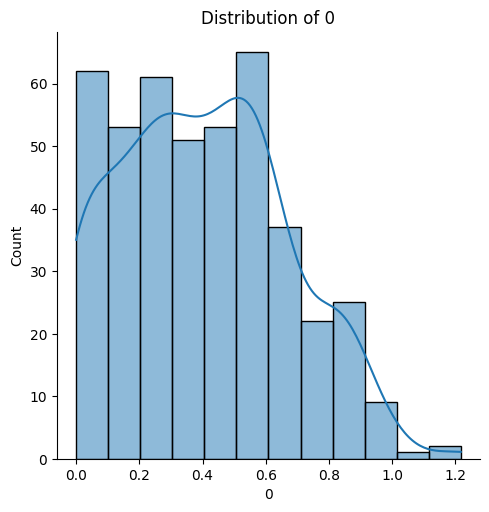

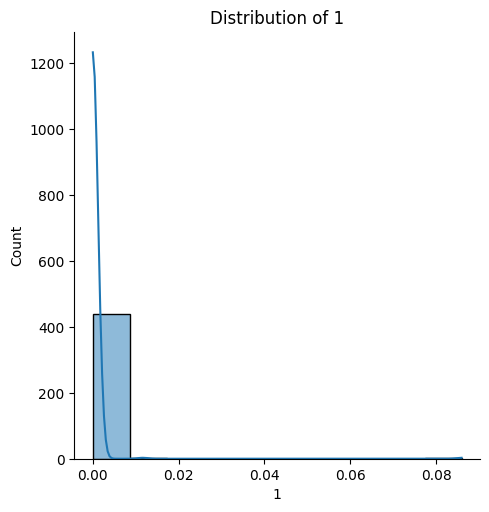

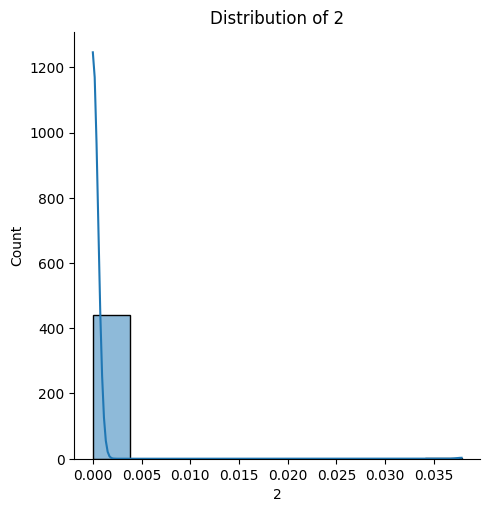

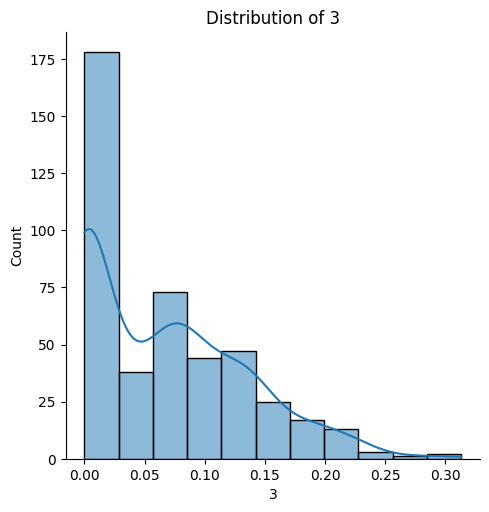

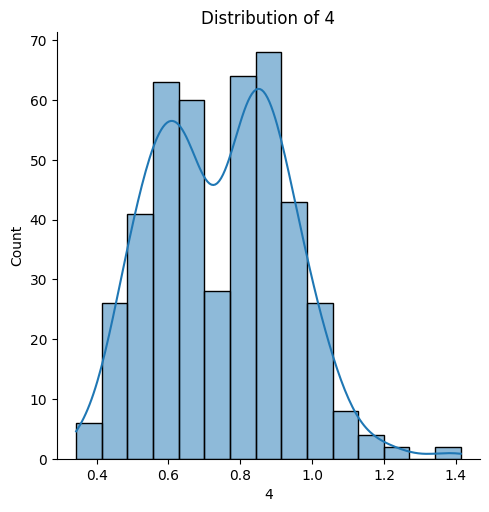

...

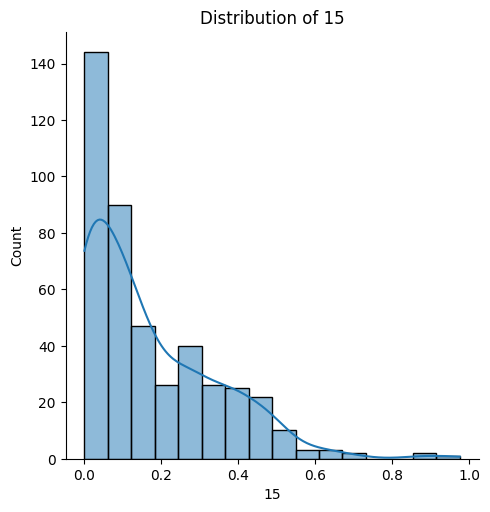

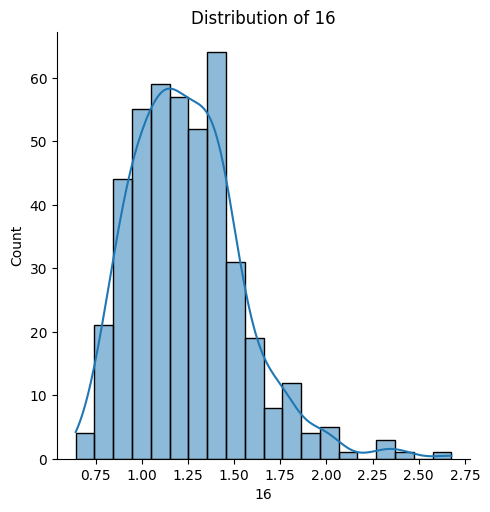

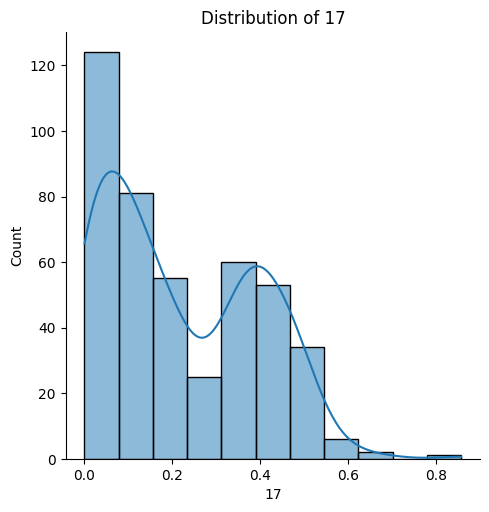

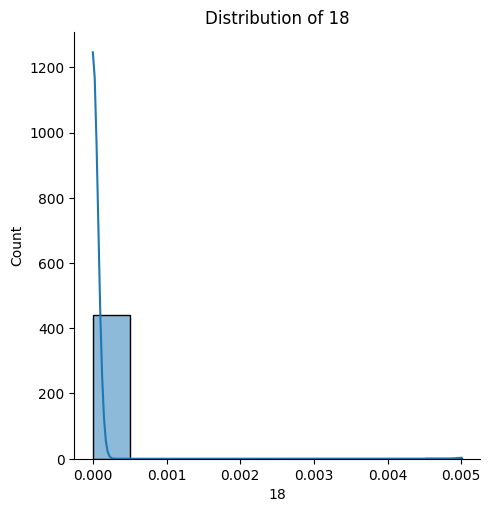

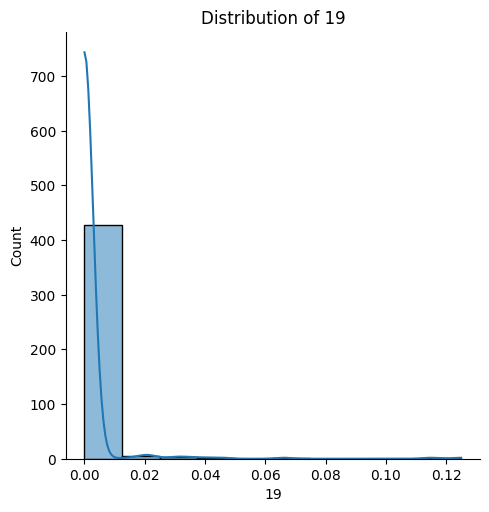

In [ ]:
for column in encoded_df.columns:
    sns.displot(encoded_df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()

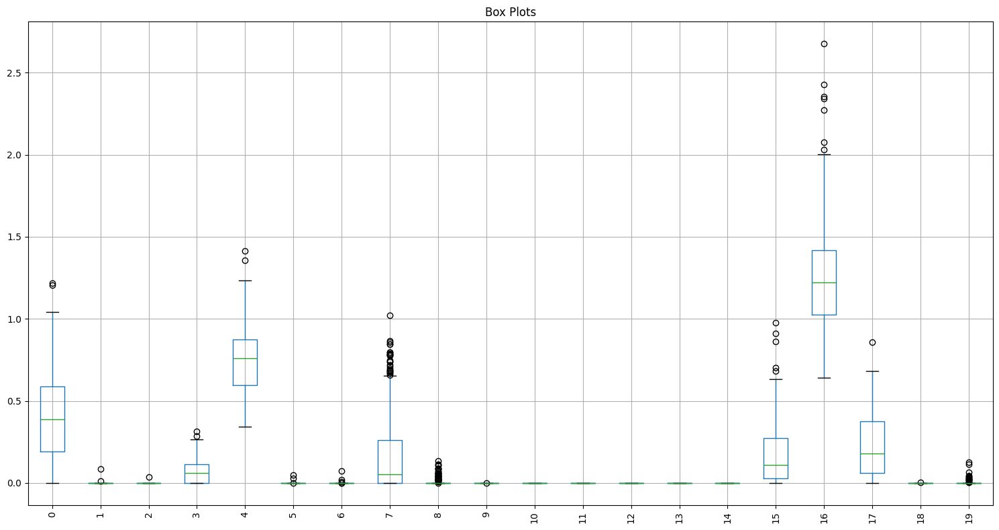

In [ ]:
plt.figure(figsize=(15, 8))
encoded_df.boxplot()
plt.title('Box Plots')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### *Scaling*

In [ ]:
# Check for outliers in each continuous feature
outlier_analysis = []

for col in range(0, 20):
    values = encoded_df[col].values

    # Method 1: IQR method
    Q1 = np.percentile(values, 25)
    Q3 = np.percentile(values, 75)
    IQR = Q3 - Q1
    outlier_threshold_low = Q1 - 1.5 * IQR
    outlier_threshold_high = Q3 + 1.5 * IQR

    n_outliers_iqr = np.sum((values < outlier_threshold_low) |
                            (values > outlier_threshold_high))
    pct_outliers_iqr = 100 * n_outliers_iqr / len(values)

    # Method 2: Z-score method
    z_scores = np.abs(stats.zscore(values))
    n_outliers_z = np.sum(z_scores > 3)
    pct_outliers_z = 100 * n_outliers_z / len(values)

    outlier_analysis.append({
        'feature': col,
        'n_outliers_iqr': n_outliers_iqr,
        'pct_outliers_iqr': pct_outliers_iqr,
        'n_outliers_z': n_outliers_z,
        'pct_outliers_z': pct_outliers_z,
        'min': values.min(),
        'max': values.max(),
        'median': np.median(values)
    })

outlier_df = pd.DataFrame(outlier_analysis)

print("="*80)
print("OUTLIER ANALYSIS")
print("="*80)
print(outlier_df[['feature', 'pct_outliers_iqr', 'pct_outliers_z', 'min', 'max']].to_string())

avg_outliers = outlier_df['pct_outliers_iqr'].mean()
print(f"\n📊 Average outlier percentage: {avg_outliers:.1f}%")

if avg_outliers > 10:
    print("⚠️  HIGH OUTLIERS (>10%) → RobustScaler is RECOMMENDED")
elif avg_outliers > 5:
    print("⚠️  MODERATE OUTLIERS (5-10%) → RobustScaler is PREFERRED")
else:
    print("✓ LOW OUTLIERS (<5%)")

OUTLIER ANALYSIS
    feature  pct_outliers_iqr  pct_outliers_z       min       max
0         0          0.453515        0.453515  0.000000  1.217287
1         1          0.453515        0.226757  0.000000  0.085950
2         2          0.226757        0.226757  0.000000  0.037854
3         3          0.453515        0.680272  0.000000  0.313076
4         4          0.453515        0.453515  0.342972  1.413736
5         5          0.680272        0.453515  0.000000  0.046462
6         6          1.133787        0.453515  0.000000  0.072900
7         7          5.668934        0.453515  0.000000  1.021985
8         8          9.977324        3.174603  0.000000  0.134669
9         9          0.226757        0.226757  0.000000  0.000800
10       10          0.000000        0.000000  0.000000  0.000000
11       11          0.000000        0.000000  0.000000  0.000000
12       12          0.000000        0.000000  0.000000  0.000000
13       13          0.000000        0.000000  0.000000  0.

In [ ]:
max_abs_scaler = MaxAbsScaler()
max_abs_scaled_encoded = max_abs_scaler.fit_transform(encoded)
max_abs_scaled_encoded

array([[0.3366013 , 0.        , 0.        , ..., 0.03851639, 0.        ,
        0.        ],
       [0.09566578, 0.        , 0.        , ..., 0.02710996, 0.        ,
        0.        ],
       [0.40690336, 0.        , 0.        , ..., 0.18572964, 0.        ,
        0.        ],
       ...,
       [0.35601267, 0.        , 0.        , ..., 0.43949282, 0.        ,
        0.        ],
       [0.4530622 , 0.        , 0.        , ..., 0.47998366, 0.        ,
        0.        ],
       [0.38146466, 0.        , 0.        , ..., 0.3682472 , 0.        ,
        0.        ]], dtype=float32)

In [ ]:
max_abs_scaled_encoded_df = pd.DataFrame(max_abs_scaled_encoded)
max_abs_scaled_encoded_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.336601,0.0,0.0,0.447101,0.642598,0.0,0.0,0.484082,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050862,0.456797,0.038516,0.0,0.0
1,0.095666,0.0,0.0,0.306123,0.439649,0.0,0.0,0.552378,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.261047,0.346956,0.027110,0.0,0.0
2,0.406903,0.0,0.0,0.240359,0.611932,0.0,0.0,0.466419,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052290,0.458077,0.185730,0.0,0.0
3,0.500897,0.0,0.0,0.664666,0.597093,0.0,0.0,0.431475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.115232,0.353926,0.065878,0.0,0.0
4,0.111749,0.0,0.0,0.627420,0.376873,0.0,0.0,0.704138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.719937,0.329269,0.017793,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436,0.516283,0.0,0.0,0.297930,0.663742,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.099221,0.661452,0.354344,0.0,0.0
437,0.501026,0.0,0.0,0.167413,0.717916,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.096119,0.632722,0.545584,0.0,0.0
438,0.356013,0.0,0.0,0.257306,0.443369,0.0,0.0,0.039522,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.063500,0.644760,0.439493,0.0,0.0
439,0.453062,0.0,0.0,0.454913,0.606721,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.078056,0.590317,0.479984,0.0,0.0


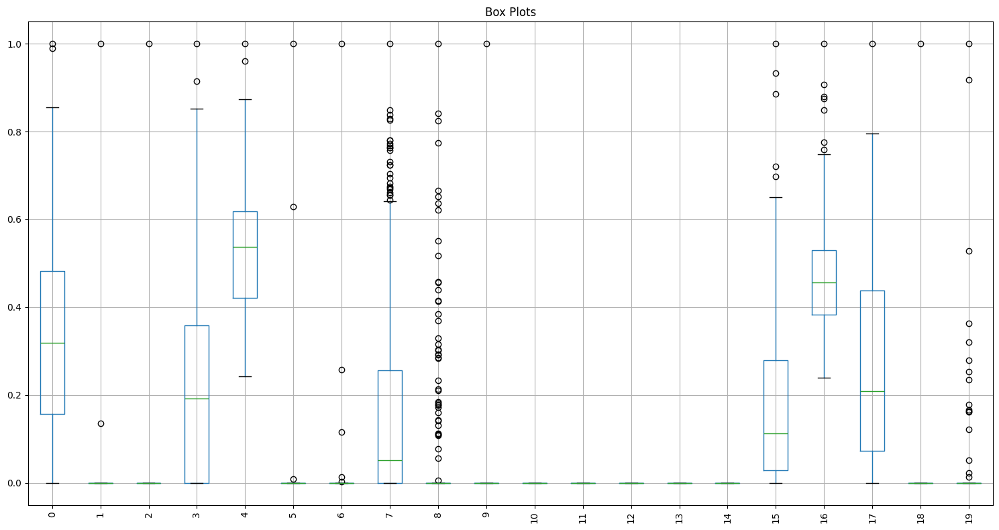

In [ ]:
plt.figure(figsize=(15, 8))
max_abs_scaled_encoded_df.boxplot()
plt.title('Box Plots')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### *OPTICS*

In [ ]:
# np.random.seed(490)

In [ ]:
print("--- Phase 1: Tuning min_samples (Visual/Exploratory) ---")
results_min_samples = []
best_min_samples = 5 # Initialized with a reasonable default

for min_samp in range(2, 30):
    optics = OPTICS(
        min_samples=min_samp,
        xi=0.05, # Default value
        min_cluster_size=0.05, # Default value
        metric='euclidean'
    )
    optics.fit(max_abs_scaled_encoded)
    labels = optics.labels_[optics.ordering_]

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)

    results_min_samples.append({
        'min_samples': min_samp,
        'n_clusters': n_clusters,
        'noise_count': n_noise,
        'noise_percent': n_noise/len(labels)*100
    })

df_min_samples = pd.DataFrame(results_min_samples)
print(df_min_samples)

--- Phase 1: Tuning min_samples (Visual/Exploratory) ---
    min_samples  n_clusters  noise_count  noise_percent
0             2           5          290      65.759637
1             3           5          283      64.172336
2             4           5          246      55.782313
3             5           6          230      52.154195
4             6           5          276      62.585034
5             7           7          213      48.299320
6             8           5          281      63.718821
7             9           6          253      57.369615
8            10           5          279      63.265306
9            11           5          283      64.172336
10           12           4          308      69.841270
11           13           3          346      78.458050
12           14           4          313      70.975057
13           15           4          319      72.335601
14           16           4          314      71.201814
15           17           3          343      7


-> Chosen best_min_samples for Phase 2: 5



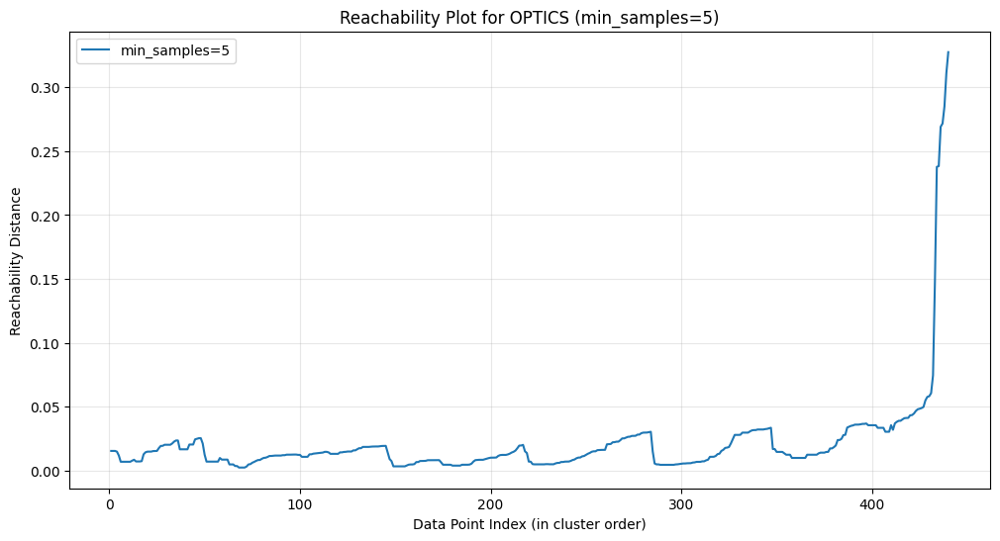


-> Chosen best_min_samples for Phase 2: 7



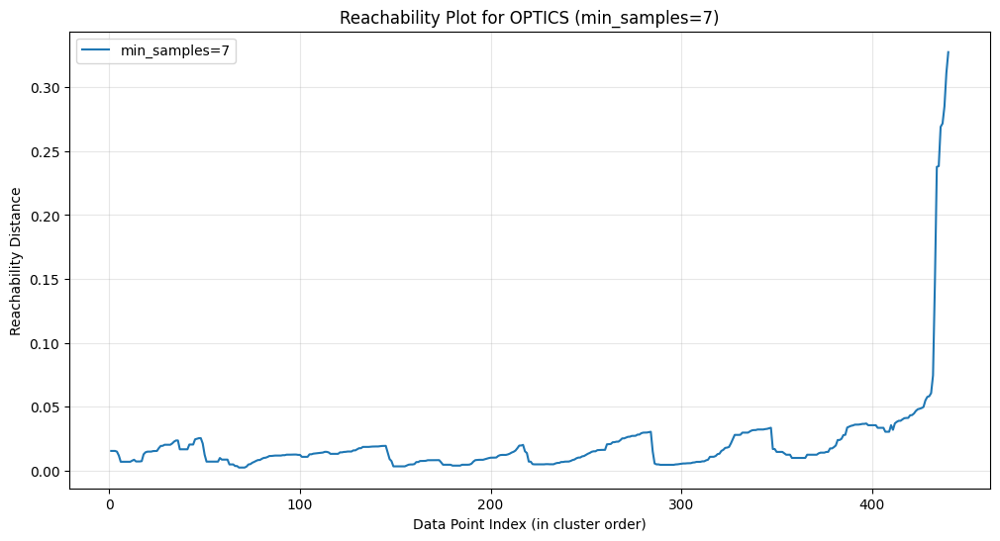

In [ ]:
# Based on the table, choose the min_samples that gives a good balance of clusters and noise for your domain.

def visual_analysis_min_samples(min_samples):
    print(f"\n-> Chosen best_min_samples for Phase 2: {min_samples}\n")

    # Plot the reachability distance for visual inspection of the chosen parameter
    reachability = optics.reachability_[optics.ordering_]
    space = np.arange(len(max_abs_scaled_encoded))
    plt.figure(figsize=(12, 6))
    plt.plot(space, reachability, label=f'min_samples={min_samples}')
    plt.title(f'Reachability Plot for OPTICS (min_samples={min_samples})')
    plt.xlabel('Data Point Index (in cluster order)')
    plt.ylabel('Reachability Distance')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

visual_analysis_min_samples(5)
visual_analysis_min_samples(7)

In [ ]:
best_min_samples = 7

In [ ]:
print("--- Phase 2: Tuning xi (Quantitative with Silhouette Score) ---")

# --- PARAMETERS TO TUNE ---
XI_VALUES = np.arange(0.01, 0.15, 0.005)
# -------------------------

results_xi = []
best_xi = 0.05
max_silhouette = -1

for xi_value in XI_VALUES:
    optics = OPTICS(
        min_samples=best_min_samples,
        xi=xi_value,
        min_cluster_size=0.05,
        metric='euclidean'
    )

    labels = optics.fit_predict(max_abs_scaled_encoded)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    silhouette = -1

    if n_clusters >= 2:
        # Filter out noise points (-1) before calculating the score
        clustered_X = max_abs_scaled_encoded[labels != -1]
        clustered_labels = labels[labels != -1]

        # Check if, after filtering, there are still at least 2 labels and more than one sample
        if len(np.unique(clustered_labels)) >= 2 and len(clustered_X) >= 2:
            silhouette = silhouette_score(clustered_X, clustered_labels)

    results_xi.append({
        'xi': round(xi_value, 4),
        'n_clusters': n_clusters,
        'silhouette_score': silhouette
    })

    if silhouette > max_silhouette:
        max_silhouette = silhouette
        best_xi = xi_value

df_xi = pd.DataFrame(results_xi)
print(df_xi)
print(f"\n-> Chosen best_xi for Phase 3: {round(best_xi, 4)}")

--- Phase 2: Tuning xi (Quantitative with Silhouette Score) ---
       xi  n_clusters  silhouette_score
0   0.010           8          0.393911
1   0.015           8          0.425739
2   0.020           8          0.427069
3   0.025           8          0.427069
4   0.030           8          0.433691
5   0.035           8          0.415610
6   0.040           8          0.415610
7   0.045           7          0.434025
8   0.050           7          0.434535
9   0.055           6          0.453650
10  0.060           5          0.446125
11  0.065           4          0.496031
12  0.070           4          0.496031
13  0.075           3          0.645599
14  0.080           3          0.645599
15  0.085           1         -1.000000
16  0.090           1         -1.000000
17  0.095           1         -1.000000
18  0.100           1         -1.000000
19  0.105           1         -1.000000
20  0.110           1         -1.000000
21  0.115           1         -1.000000
22  0.120       

In [ ]:
print("--- Phase 3: Tuning min_cluster_size (Constraint) ---")

# --- PARAMETERS TO TUNE ---
MIN_CLUSTER_SIZES = np.arange(2, 16, 1)
# -------------------------

results_size = []
best_min_size = 0.05
max_silhouette = -1 # Reset max silhouette

for min_size in MIN_CLUSTER_SIZES:
    optics = OPTICS(
        min_samples=best_min_samples,
        xi=round(best_xi, 4),
        min_cluster_size=min_size, # This is the parameter being tuned
        metric='euclidean'
    )
    labels = optics.fit_predict(max_abs_scaled_encoded)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    silhouette = -1

    # Re-calculate Silhouette Score
    if n_clusters >= 2:
        clustered_X = max_abs_scaled_encoded[labels != -1]
        clustered_labels = labels[labels != -1]

        if len(np.unique(clustered_labels)) >= 2 and len(clustered_X) >= 2:
            silhouette = silhouette_score(clustered_X, clustered_labels)

    results_size.append({
        'min_cluster_size': min_size,
        'n_clusters': n_clusters,
        'silhouette_score': silhouette
    })

    if silhouette > max_silhouette:
        max_silhouette = silhouette
        best_min_size = min_size

df_size = pd.DataFrame(results_size)
print(df_size)
print(f"\n-> Chosen best_min_cluster_size for Phase 4: {best_min_size}")

--- Phase 3: Tuning min_cluster_size (Constraint) ---
    min_cluster_size  n_clusters  silhouette_score
0                  2           8          0.554517
1                  3           8          0.554517
2                  4           7          0.572458
3                  5           7          0.572458
4                  6           7          0.572458
5                  7           7          0.572458
6                  8           7          0.564115
7                  9           7          0.564115
8                 10           7          0.564115
9                 11           5          0.614091
10                12           5          0.614091
11                13           5          0.614091
12                14           5          0.600095
13                15           5          0.600095

-> Chosen best_min_cluster_size for Phase 4: 11


In [ ]:
print("--- Phase 4: Tuning metric (Distance Function) ---")

# --- PARAMETERS TO TUNE ---
METRICS = ['cityblock', 'cosine', 'euclidean', 'l1', 'l2',
               'manhattan', 'braycurtis', 'canberra', 'chebyshev',
               'correlation']

# -------------------------

results_metric = []
best_metric = 'euclidean'
max_silhouette = -1 # Reset max silhouette

for metric_val in METRICS:
    # Use all the best parameters from previous steps
    optics = OPTICS(
        min_samples=best_min_samples,
        xi=round(best_xi, 4),
        min_cluster_size=best_min_size,
        metric=metric_val # This is the parameter being tuned
    )
    labels = optics.fit_predict(max_abs_scaled_encoded)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    silhouette = -1

    # Re-calculate Silhouette Score
    if n_clusters >= 2:
        clustered_X = max_abs_scaled_encoded[labels != -1]
        clustered_labels = labels[labels != -1]

        if len(np.unique(clustered_labels)) >= 2 and len(clustered_X) >= 2:
            silhouette = silhouette_score(clustered_X, clustered_labels, metric=metric_val)

    results_metric.append({
        'metric': metric_val,
        'n_clusters': n_clusters,
        'silhouette_score': silhouette
    })

    if silhouette > max_silhouette:
        max_silhouette = silhouette
        best_metric = metric_val

df_metric = pd.DataFrame(results_metric)
print(df_metric)
print(f"\n-> Final Best Parameters:\n"
      f"   - min_samples: {best_min_samples}\n"
      f"   - xi: {round(best_xi, 4)}\n"
      f"   - min_cluster_size: {best_min_size}\n"
      f"   - metric: {best_metric}\n"
      f"   - Final Silhouette Score: {max_silhouette:.4f}")

--- Phase 4: Tuning metric (Distance Function) ---
        metric  n_clusters  silhouette_score
0    cityblock           7          0.618460
1       cosine           7          0.755539
2    euclidean           5          0.614091
3           l1           7          0.618460
4           l2           5          0.614091
5    manhattan           7          0.618460
6   braycurtis           8          0.510744
7     canberra           8          0.459561
8    chebyshev           5          0.588582
9  correlation           7          0.746781

-> Final Best Parameters:
   - min_samples: 7
   - xi: 0.075
   - min_cluster_size: 11
   - metric: cosine
   - Final Silhouette Score: 0.7555


In [ ]:
optics = OPTICS(
        min_samples=best_min_samples, # 7
        xi=round(best_xi, 4), # 0.075
        min_cluster_size=best_min_size, # 11
        metric=best_metric, # cosine
        n_jobs=1
)

optics.fit(max_abs_scaled_encoded)

# Cluster labels
labels = optics.labels_

In [ ]:
# Storing the cluster labels of each point
labels_ = optics.labels_[optics.ordering_]

print(labels_)

[-1 -1 -1 -1 -1 -1 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  2  2  2  2  2  2  2  2  2  2  2
  2  2 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1

In [ ]:
unique, counts = np.unique(labels[labels != -1], return_counts=True)
print(f"\nCluster sizes:")
for cluster_id, size in zip(unique, counts):
    print(f"  Cluster {cluster_id}: {size} samples")


Cluster sizes:
  Cluster 0: 15 samples
  Cluster 1: 17 samples
  Cluster 2: 13 samples
  Cluster 3: 19 samples
  Cluster 4: 43 samples
  Cluster 5: 43 samples
  Cluster 6: 13 samples


In [ ]:
feature_names = list(scaled_data_df.columns)

In [ ]:
# ========================================
# Get reconstructions
# ========================================
# Make sure to use scaled_data (MaxAbs scaled) as input
reconstructed_data = autoencoder.predict(scaled_data)  # (441, 106)

# ========================================
# Analyze each cluster
# ========================================
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

cluster_profiles = []

for cluster_id in range(n_clusters):
    mask = labels == cluster_id
    n_samples = mask.sum()

    # Get data for this cluster
    cluster_original = scaled_data[mask]
    cluster_reconstructed = reconstructed_data[mask]
    cluster_encoded = encoded[mask]

    # ========================================
    # Analysis 1: Reconstruction Quality
    # ========================================
    reconstruction_error = np.mean((cluster_original - cluster_reconstructed)**2)
    rmse = np.sqrt(reconstruction_error)
    mae = np.mean(np.abs(cluster_original - cluster_reconstructed))

    # ========================================
    # Analysis 2: Original Feature Patterns
    # ========================================
    # Which original features are HIGH in this cluster?
    cluster_mean_original = cluster_original.mean(axis=0)  # (106,)
    overall_mean_original = scaled_data.mean(axis=0)       # (106,)

    # Feature deviations from overall mean | distinctive_features
    feature_deviations = cluster_mean_original - overall_mean_original
    top_high_features = np.argsort(feature_deviations)[-5:][::-1]
    top_low_features = np.argsort(feature_deviations)[:5]

    # ========================================
    # Analysis 3: Encoded Feature Patterns
    # ========================================
    active_dims = np.mean(np.abs(cluster_encoded) > 0.1, axis=1).mean()
    mean_activation = np.mean(np.abs(cluster_encoded))
    sparsity = np.mean(np.abs(cluster_encoded) < 0.1) * 100

    # Which encoded dimensions are most active?
    encoded_dim_activations = np.mean(np.abs(cluster_encoded), axis=0)
    top_encoded_dims = np.argsort(encoded_dim_activations)[-3:][::-1]

    cluster_profiles.append({
        'cluster_id': cluster_id,
        'n_samples': n_samples,
        'reconstruction_mse': reconstruction_error,
        'reconstruction_rmse': rmse,
        'reconstruction_mae': mae,
        'top_high_features': top_high_features,
        'top_low_features': top_low_features,
        'feature_deviations_high': feature_deviations[top_high_features],
        'feature_deviations_low': feature_deviations[top_low_features],
        'sparsity': sparsity,
        'mean_activation': mean_activation,
        'active_dims': active_dims,
        'top_encoded_dims': top_encoded_dims,
        'encoded_activations': encoded_dim_activations[top_encoded_dims]
    })

    print(f"\n{'='*70}")
    print(f"CLUSTER {cluster_id} PROFILE (n={n_samples})")
    print(f"{'='*70}")

    print(f"\n📊 RECONSTRUCTION QUALITY:")
    print(f"  MSE: {reconstruction_error:.6f}")
    print(f"  RMSE: {rmse:.6f}")
    print(f"  MAE: {mae:.6f}")

    print(f"\n📈 ORIGINAL FEATURES (106D) - What makes this cluster unique:")
    print(f"  Features HIGHER than average:")
    for i, feat_idx in enumerate(top_high_features):
        print(f"    Feature {feature_names[feat_idx]}: "
              f"cluster={cluster_mean_original[feat_idx]:.3f}, "
              f"overall={overall_mean_original[feat_idx]:.3f}, "
              f"diff={feature_deviations[feat_idx]:+.3f}")

    print(f"  Features LOWER than average:")
    for i, feat_idx in enumerate(top_low_features):
        print(f"    Feature {feature_names[feat_idx]}: "
              f"cluster={cluster_mean_original[feat_idx]:.3f}, "
              f"overall={overall_mean_original[feat_idx]:.3f}, "
              f"diff={feature_deviations[feat_idx]:+.3f}")

    print(f"\n🧬 ENCODED REPRESENTATION (20D) - Learned features:")
    print(f"  Sparsity: {sparsity:.1f}%")
    print(f"  Mean activation: {mean_activation:.4f}")
    print(f"  Active dimensions: {active_dims:.1f}/20")
    print(f"  Top 3 active encoded dimensions:")
    for dim, activation in zip(top_encoded_dims, encoded_dim_activations[top_encoded_dims]):
        print(f"    Encoded dim {dim}: {activation:.4f}")

# Prepare data for the DataFrame
data_for_df = []
for profile in cluster_profiles:
    cluster_id = profile['cluster_id']
    for i, feat_idx in enumerate(profile['top_high_features']):
        data_for_df.append({
            'cluster_id': cluster_id,
            'feature_name': feature_names[feat_idx],
            'deviation_from_overall_mean': profile['feature_deviations_high'][i]
        })

# Generate the DataFrame
df_high_features_per_cluster = pd.DataFrame(data_for_df)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

CLUSTER 0 PROFILE (n=15)

📊 RECONSTRUCTION QUALITY:
  MSE: 0.012173
  RMSE: 0.110331
  MAE: 0.061661

📈 ORIGINAL FEATURES (106D) - What makes this cluster unique:
  Features HIGHER than average:
    Feature city_Medellin: cluster=1.000, overall=0.224, diff=+0.776
    Feature sex: cluster=1.000, overall=0.481, diff=+0.519
    Feature age: cluster=0.777, overall=0.656, diff=+0.121
    Feature Otu00009: cluster=0.085, overall=0.034, diff=+0.051
    Feature Otu00028: cluster=0.095, overall=0.047, diff=+0.048
  Features LOWER than average:
    Feature city_Cali: cluster=0.000, overall=0.202, diff=-0.202
    Feature city_Bogota: cluster=0.000, overall=0.193, diff=-0.193
    Feature city_Bucaramanga: cluster=0.000, overall=0.179, diff=-0.179
    Feature Otu00151: cluster=0.037, overall=0.085, diff=-0.049
    Feature Otu00035: cluster=0.023, overall=0.062, diff=-0.039

🧬 ENCODED REPRESENTATION (20D) - Learned features:
  Sparsity: 71.7%
  Mean activatio

For visualizing the next table completely, please select the three dots that appear at the top left corner of the output box and then select the option "View output fullscreen."

In [ ]:
merged_high_otus_with_taxonomy_df = pd.merge(df_high_features_per_cluster, df_otus_tax, left_on='feature_name', right_on='OTU', how='inner')
merged_high_otus_with_taxonomy_df.drop(columns=['OTU'], inplace=True) # Drop redundant 'OTU' column after merge
print("Mapped important OTUs with their taxonomic information:")
merged_high_otus_with_taxonomy_df

Mapped important OTUs with their taxonomic information:


,cluster_id,feature_name,deviation_from_overall_mean,Taxonomy,Phylum,Class,Family,Total_Abundance
0,0,Otu00009,0.051077,k__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Proteobacteria,Gammaproteobacteria,Enterobacteriaceae,404155
1,0,Otu00028,0.048395,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Veillonellaceae,116464
2,1,Otu00002,0.056995,k__Bacteria;p__Bacteroidetes;c__Bacteroidia;o_...,Bacteroidetes,Bacteroidia,Prevotellaceae,1127999
3,1,Otu00073,0.042510,k__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Proteobacteria,Gammaproteobacteria,Pasteurellaceae,53679
4,1,Otu00175,0.041147,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Ruminococcaceae,6079
5,2,Otu00129,0.046680,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Ruminococcaceae,39356
6,2,Otu00015,0.037578,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Ruminococcaceae,170692
7,2,Otu00029,0.033530,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Clostridiaceae,119943
8,3,Otu00119,0.045685,k__Bacteria;p__Proteobacteria;c__Deltaproteoba...,Proteobacteria,Deltaproteobacteria,Desulfovibrionaceae,34208
9,3,Otu00102,0.032492,k__Bacteria;p__Firmicutes;c__Clostridia;o__Clo...,Firmicutes,Clostridia,Ruminococcaceae,29340


/tmp/ipython-input-1510555965.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20c', n_actual_clusters)


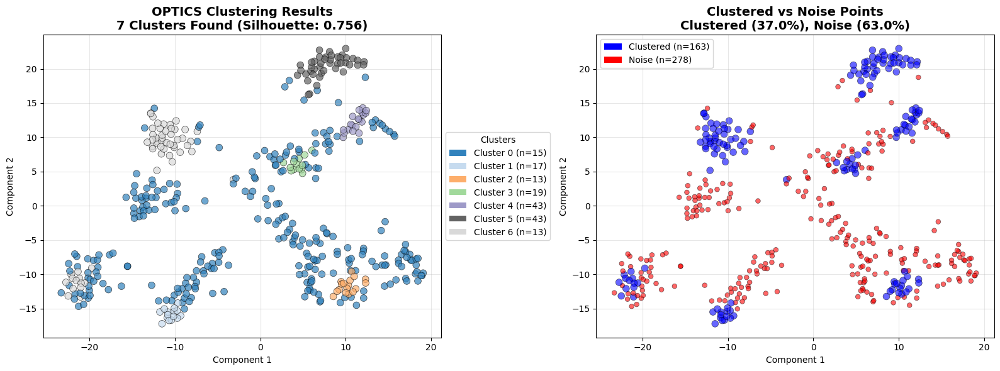

In [ ]:
tsne = TSNE(n_components=2, random_state=490, perplexity=30)
encoded_2d = tsne.fit_transform(max_abs_scaled_encoded)

# Calculate counts and percentages for labels
total_samples = len(labels)
n_noise = np.sum(labels == -1)
n_clustered = total_samples - n_noise
noise_percent = (n_noise / total_samples) * 100
clustered_percent = (n_clustered / total_samples) * 100

# Determine the number of actual clusters (excluding noise)
unique_clusters = np.unique(labels[labels != -1])
n_actual_clusters = len(unique_clusters)

# Calculate Silhouette Score for clustered points
silhouette_avg = -1 # Default to -1 if not enough clusters/samples
if n_actual_clusters >= 2:
    clustered_X_for_silhouette = max_abs_scaled_encoded[labels != -1]
    clustered_labels_for_silhouette = labels[labels != -1]
    if len(np.unique(clustered_labels_for_silhouette)) >= 2 and len(clustered_X_for_silhouette) >= 2:
        silhouette_avg = silhouette_score(clustered_X_for_silhouette, clustered_labels_for_silhouette, metric=best_metric)


# Get colormap for clusters
cmap = plt.cm.get_cmap('tab20c', n_actual_clusters)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: All points, with specific legends for each cluster
ax1 = axes[0]
scatter1 = ax1.scatter(encoded_2d[:, 0], encoded_2d[:, 1],
                       c=labels, cmap=cmap,
                       s=60, alpha=0.7, edgecolors='black', linewidth=0.5)
ax1.set_title(f'OPTICS Clustering Results\n{n_actual_clusters} Clusters Found (Silhouette: {silhouette_avg:.3f})',
              fontsize=14, fontweight='bold')
ax1.set_xlabel('Component 1')
ax1.set_ylabel('Component 2')
ax1.grid(True, alpha=0.3)

# Generate legend for clusters (excluding noise)
cluster_legends = []
for i, cluster_id in enumerate(unique_clusters):
    count = np.sum(labels == cluster_id)
    cluster_legends.append(Patch(facecolor=cmap(i), label=f'Cluster {cluster_id} (n={count})'))
ax1.legend(handles=cluster_legends, title='Clusters', loc='center left', bbox_to_anchor=(1, 0.5))

# Plot 2: Highlight noise vs clusters
colors_binary = ['red' if l == -1 else 'blue' for l in labels]
sizes_binary = [30 if l == -1 else 60 for l in labels] # Smaller size for noise points
ax2 = axes[1]
ax2.scatter(encoded_2d[:, 0], encoded_2d[:, 1],
           c=colors_binary, s=sizes_binary, alpha=0.6, edgecolors='black', linewidth=0.5)
ax2.set_title(f'Clustered vs Noise Points\nClustered ({clustered_percent:.1f}%), Noise ({noise_percent:.1f}%)',
              fontsize=14, fontweight='bold')
ax2.set_xlabel('Component 1')
ax2.set_ylabel('Component 2')
ax2.grid(True, alpha=0.3)

# Add legend for clustered vs. noise
legend_elements_binary = [
    Patch(facecolor='blue', label=f'Clustered (n={n_clustered})'),
    Patch(facecolor='red', label=f'Noise (n={n_noise})')
]
ax2.legend(handles=legend_elements_binary, loc='best')

plt.tight_layout()
plt.show()

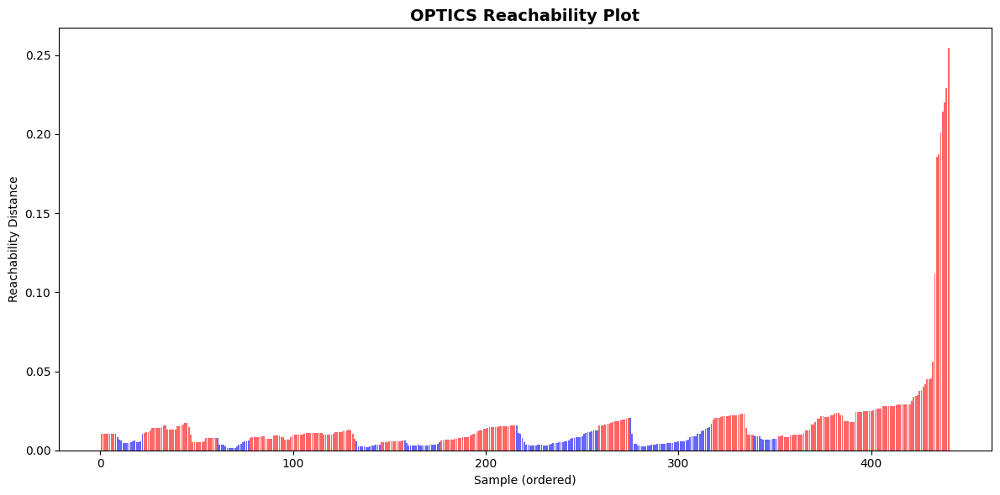

In [ ]:
# Visualize OPTICS reachability plot
plt.figure(figsize=(12, 6))

# Reachability distances
space = np.arange(len(max_abs_scaled_encoded))
reachability = optics.reachability_[optics.ordering_]
labels_ordered = labels[optics.ordering_]

# Plot
colors = ['r' if l == -1 else 'b' for l in labels_ordered]
plt.bar(space, reachability, color=colors, alpha=0.6)
plt.xlabel('Sample (ordered)')
plt.ylabel('Reachability Distance')
plt.title('OPTICS Reachability Plot', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
data['Cluster'] = labels

In [ ]:
data

,city,sex,age,Otu00001,Otu00002,Otu00003,Otu00004,Otu00005,Otu00006,Otu00007,...,Otu00175,Otu00177,Otu00188,Otu00197,Otu00201,Otu00220,Otu00228,Otu00284,Otu00325,Cluster
MI_001_H,Medellin,Male,36,354,817,50,31,448,547,727,...,54,7,0,0,14,3,0,2,7,-1
MI_002_H,Medellin,Female,40,168,9,131,3005,68,10187,570,...,10,3,2,2,0,4,0,11,89,-1
MI_003_H,Medellin,Male,53,19,174,6211,79,1063,0,6077,...,0,1,0,10,139,5,0,0,0,-1
MI_004_H,Medellin,Male,58,264,1816,159,16,110,4,12,...,0,8,2,7,6,0,0,0,0,0
MI_005_H,Medellin,Female,44,0,2,0,12,598,39,0,...,52,7,54,0,0,40,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MI_454_H,Cali,Male,60,0,1,325,926,109,4661,3,...,7,233,6,4,16,0,6,0,0,3
MI_455_H,Cali,Male,60,187,1270,646,29983,100,186,4,...,141,29,0,16,0,1,14,3,0,-1
MI_456_H,Cali,Female,46,418,1512,198,20,1620,198,575,...,5,57,4,0,7,18,67,0,34,-1
MI_458_H1,Cali,Male,40,189,3443,130,7428,375,13,28,...,5,6,19,10,0,0,0,3,0,3


In [ ]:
data.to_csv('clustered_data.csv', index=False)

/tmp/ipython-input-2087503318.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster',data=data,ax=ax[0,0],palette='Set2');


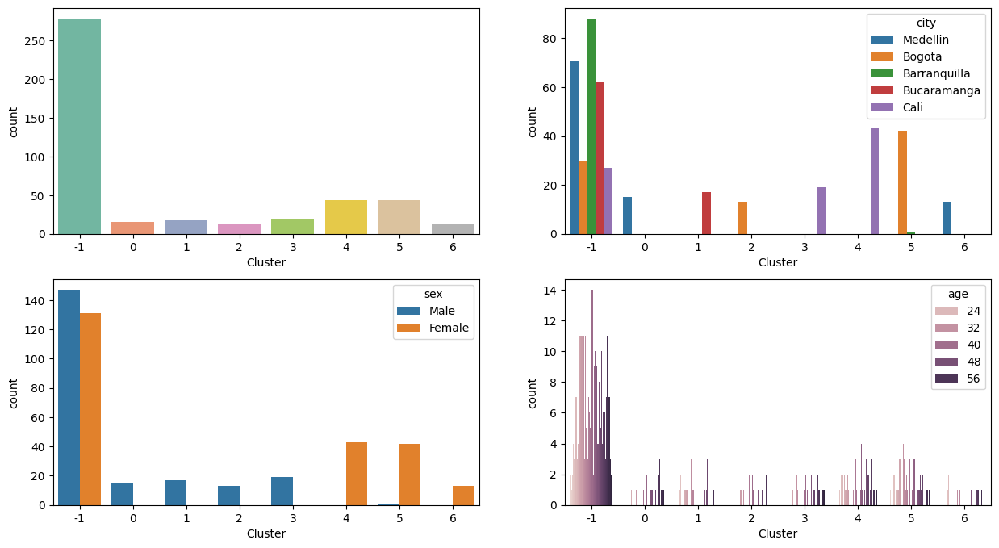

In [ ]:
# Reference: (Shah, 2022)

f,ax=plt.subplots(2,2,figsize=(15,8))
sns.countplot(x='Cluster',data=data,ax=ax[0,0],palette='Set2');
sns.countplot(x='Cluster',data=data,ax=ax[0,1], hue='city');
sns.countplot(x='Cluster',data=data,ax=ax[1,0], hue='sex');
sns.countplot(x='Cluster',data=data,ax=ax[1,1], hue='age');